# INTERPOLACIÓN Y EXTRAPOLACIÓN POR ZONAS

### GRÁFICO DISPERSIÓN DEL PRECIO PROMEDIO POR ZONAS

In [ ]:
# 1. Librerias
import numpy as np 
import pandas as pd 
import matplotlib as mp 
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import itertools
from statsmodels.tsa.seasonal import seasonal_decompose

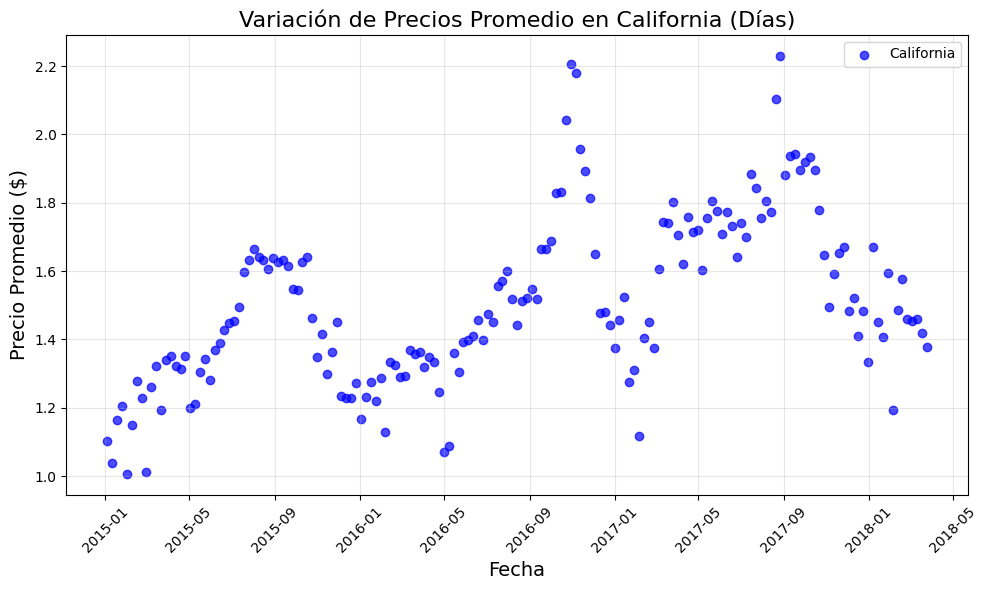

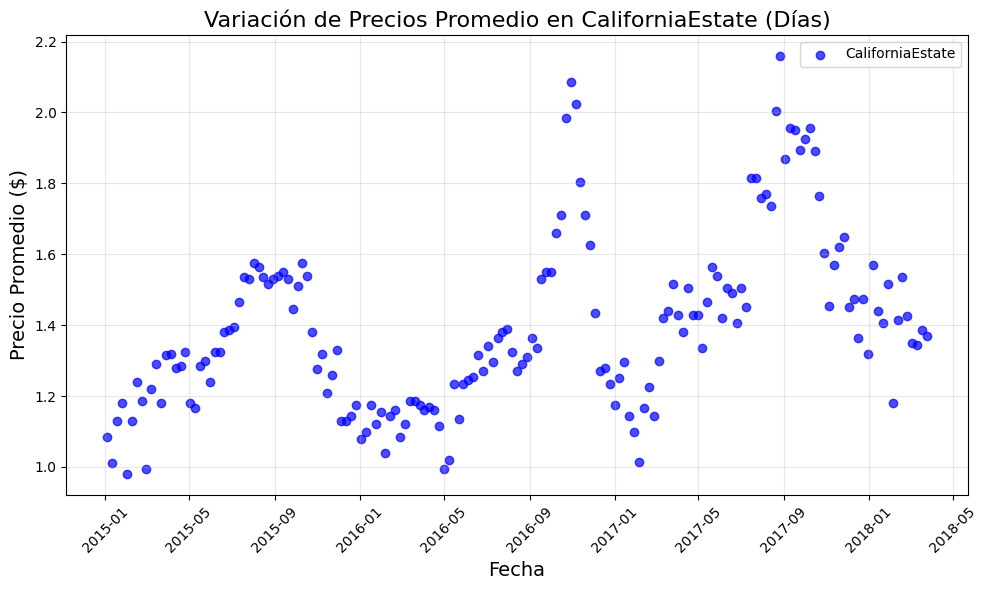

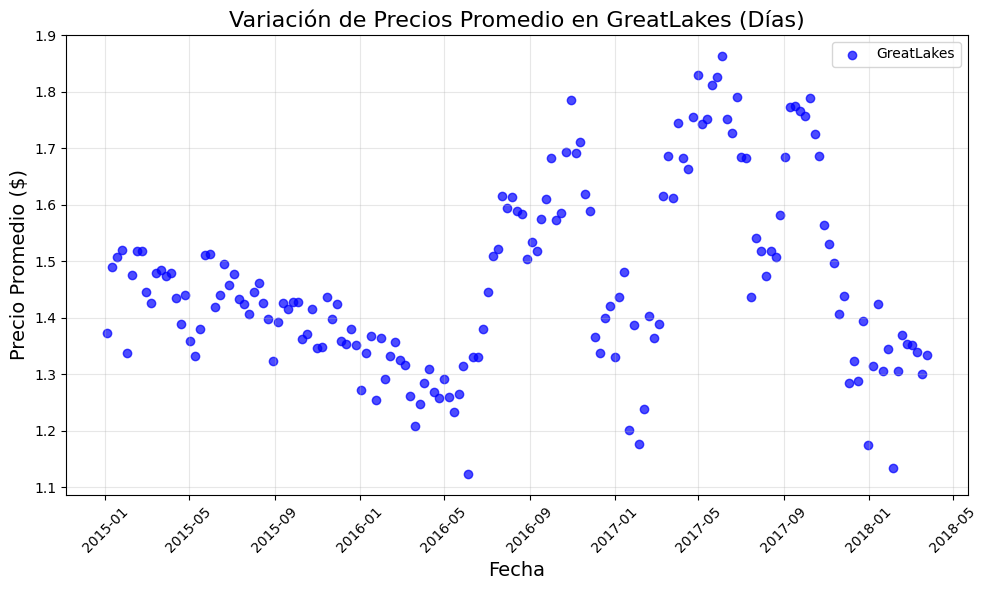

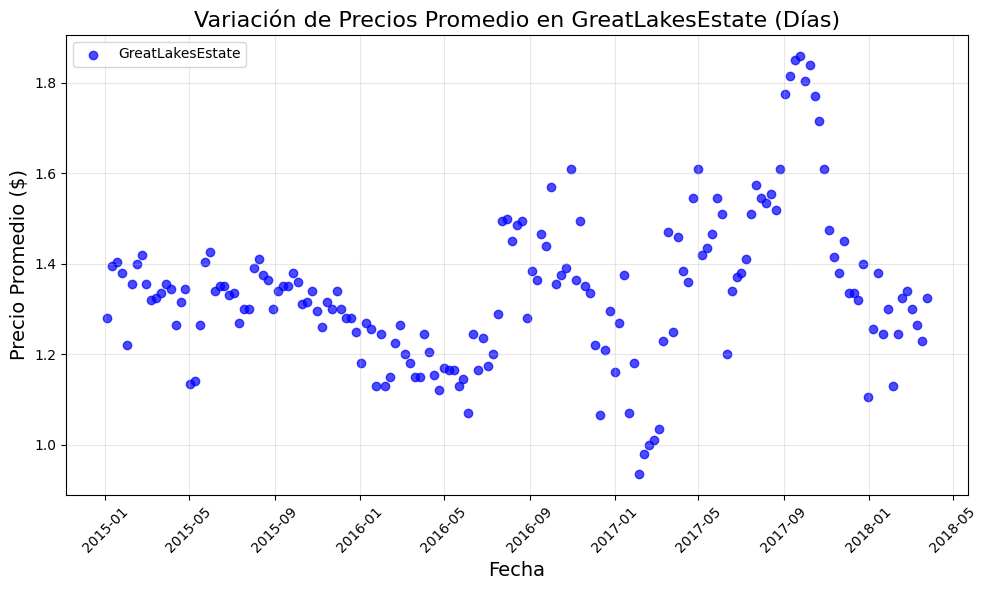

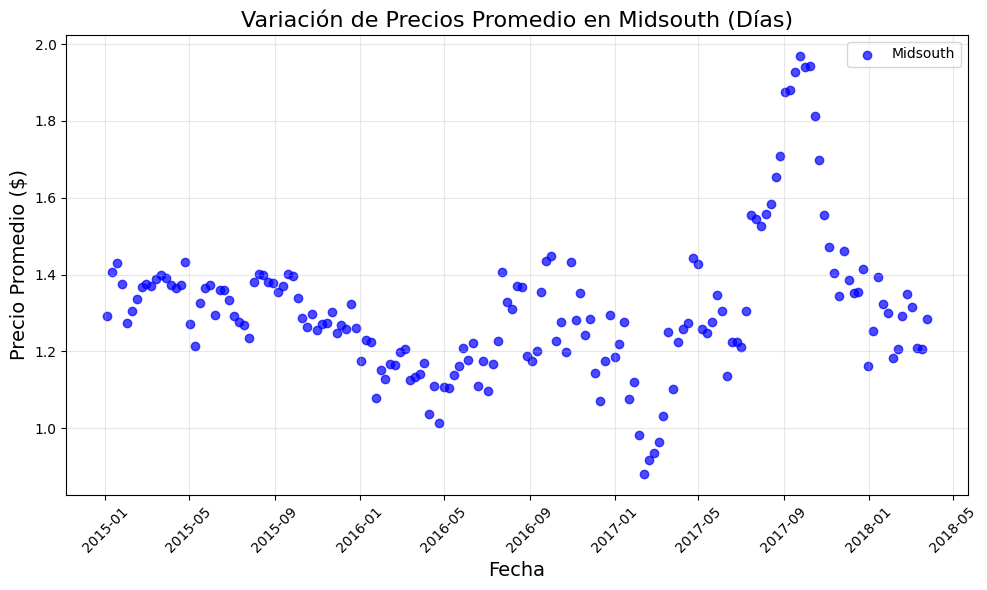

...

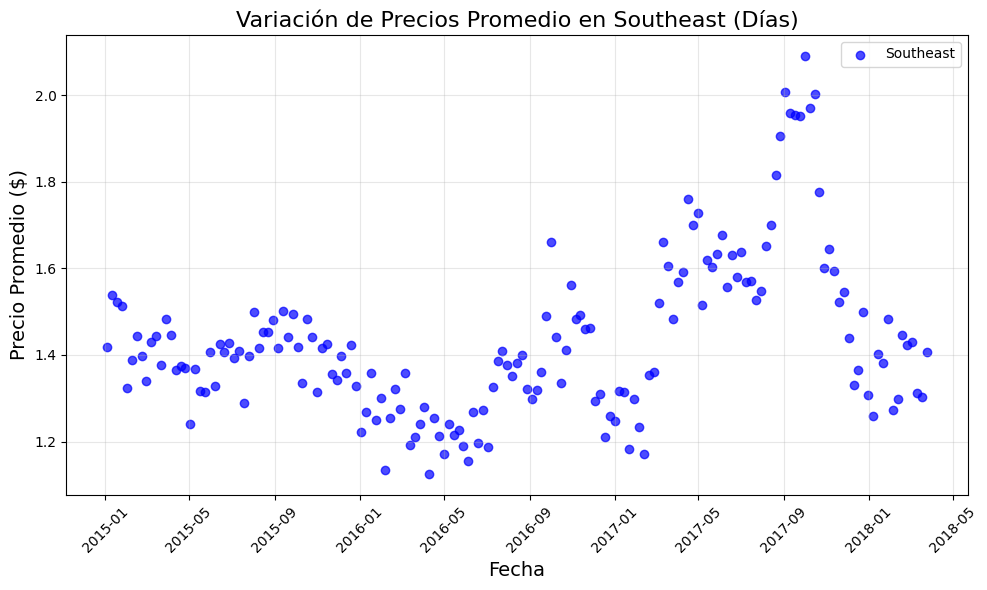

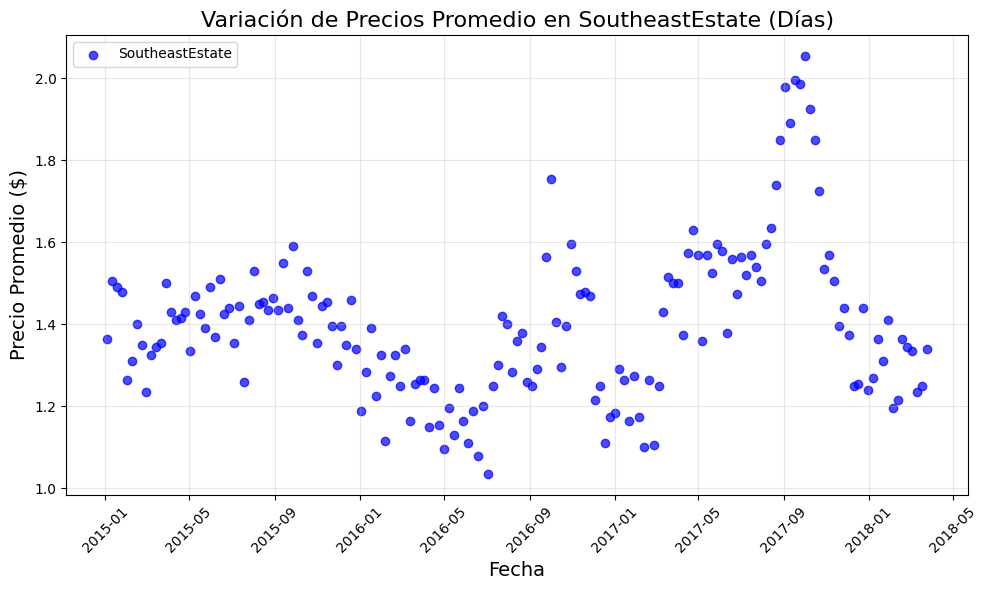

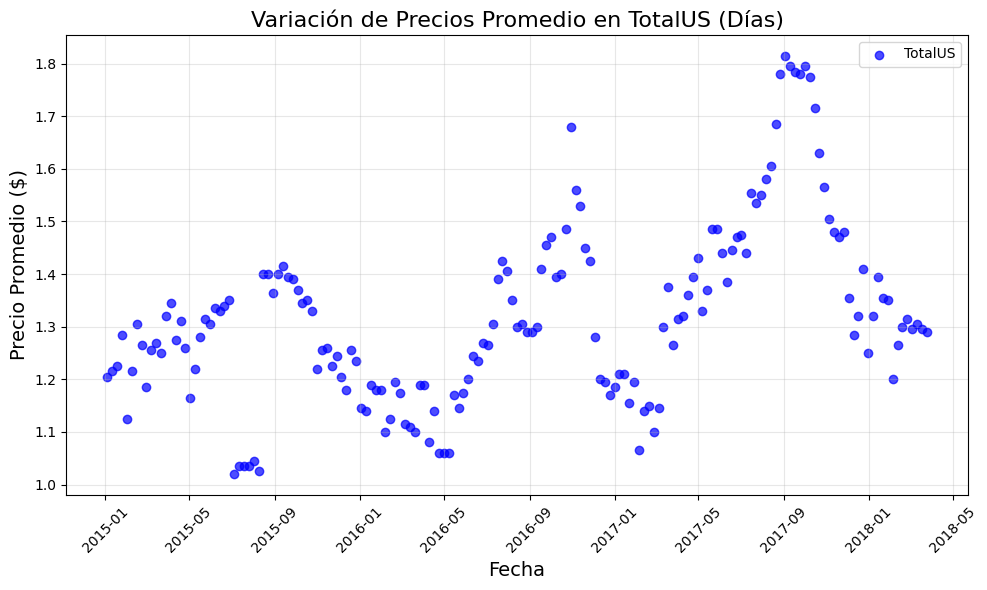

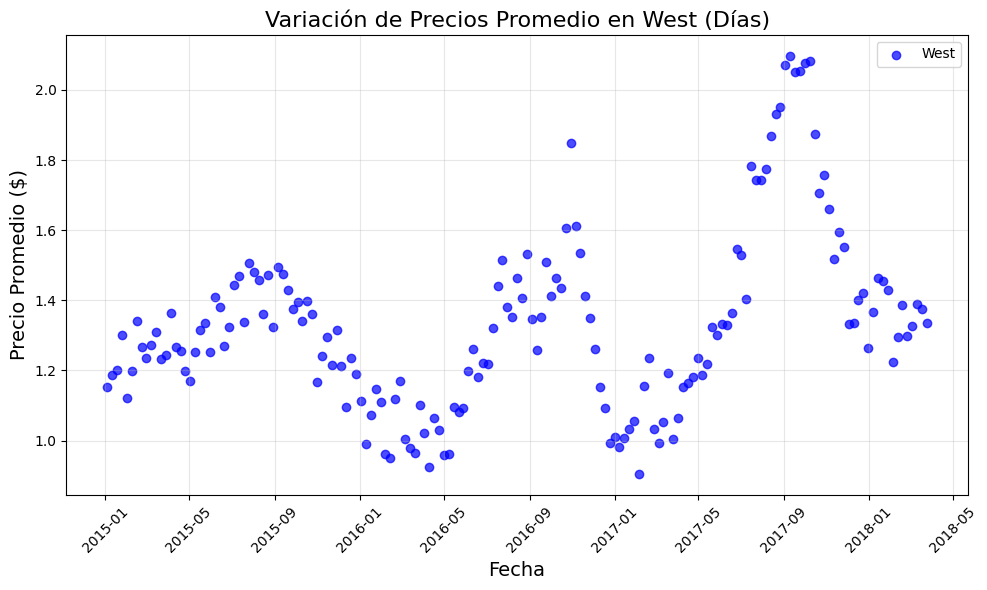

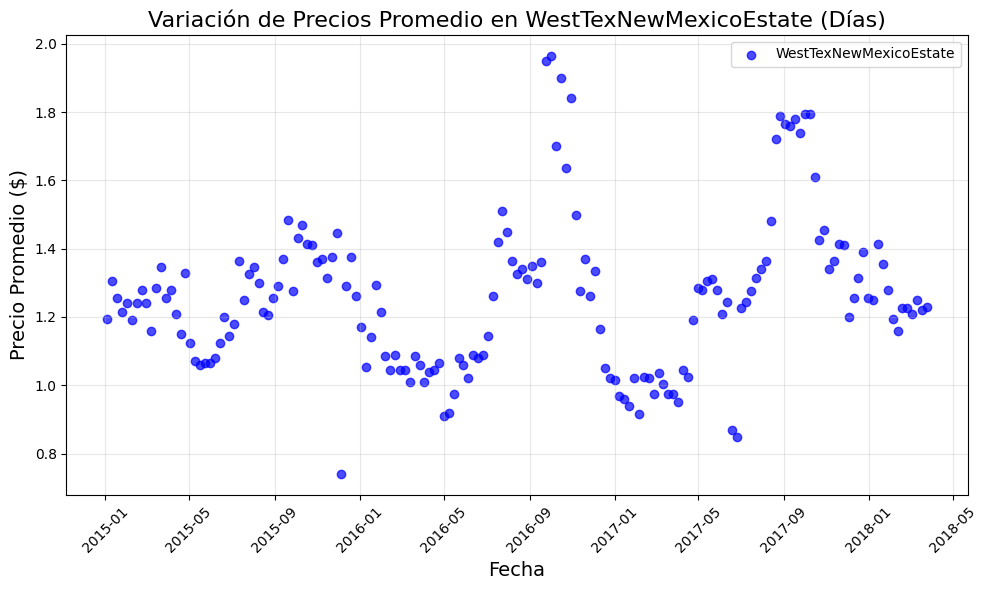

In [ ]:

advocado_data = pd.read_csv("avocado.csv")

# 2. columna 'Date' de tipo datetime
advocado_data['Date'] = pd.to_datetime(advocado_data['Date'])

# 3. Mapeo de Regiones
region_to_broad = {
    # California
    'LosAngeles': 'California',
    'SanDiego': 'California',
    'SanFrancisco': 'California',
    'Sacramento': 'California',

    # Great Lakes
    'Chicago': 'GreatLakes',
    'Detroit': 'GreatLakes',
    'Cleveland': 'GreatLakes',
    'BuffaloRochester': 'GreatLakes',
    'GrandRapids': 'GreatLakes',

    # Midsouth
    'Nashville': 'Midsouth',
    'Louisville': 'Midsouth',
    'CincinnatiDayton': 'Midsouth',
    'Indianapolis': 'Midsouth',
    'Columbus': 'Midsouth',

    # Northeast
    'NewYork': 'Northeast',
    'Boston': 'Northeast',
    'Philadelphia': 'Northeast',
    'HartfordSpringfield': 'Northeast',
    'HarrisburgScranton': 'Northeast',
    'Syracuse': 'Northeast',
    'Pittsburgh': 'Northeast',

    # Northern New England
    'NorthernNewEngland': 'NorthernNewEngland',

    # South Carolina
    'SouthCarolina': 'SouthCarolina',

    # South Central
    'DallasFtWorth': 'SouthCentral',
    'Houston': 'SouthCentral',
    'NewOrleansMobile': 'SouthCentral',
    'SouthCentral': 'SouthCentral',

    # Southeast
    'Atlanta': 'Southeast',
    'Charlotte': 'Southeast',
    'RaleighGreensboro': 'Southeast',
    'Jacksonville': 'Southeast',
    'Tampa': 'Southeast',
    'MiamiFtLauderdale': 'Southeast',
    'Orlando': 'Southeast',

    # West
    'Seattle': 'West',
    'Portland': 'West',
    'Spokane': 'West',
    'LasVegas': 'West',
    'PhoenixTucson': 'West',
    'West': 'West',

    # West Texas/New Mexico
    'WestTexNewMexico': 'WestTexNewMexicoEstate',
    'ElPaso': 'WestTexNewMexico',
    'Albany': 'Northeast', 
    'BaltimoreWashington': 'Northeast', 
    'Boise': 'West', 
    'Denver': 'West',  
    'RichmondNorfolk': 'Southeast',
    'Roanoke': 'Southeast', 
    'Plains': 'Midsouth',  
    'StLouis': 'Midsouth', 

    # BROAD REGIONS (SEPARADO)
    'California': 'CaliforniaEstate',  
    'GreatLakes': 'GreatLakesEstate', 
    'Midsouth': 'MidsouthEstate',  
    'Northeast': 'NortheastEstate',  
    'SouthCentral': 'SouthCentralEstate',  
    'Southeast': 'SoutheastEstate',
    'TotalUS':'TotalUS'
}

# 4. Crear la columna `broad_region` basada en el mapeo
advocado_data['broad_region'] = advocado_data['region'].map(region_to_broad)

# 5. Agrupar por broad_region y Date, y calcular el promedio de AveragePrice
grouped_broad_df = advocado_data.groupby(['broad_region', 'Date'])['AveragePrice'].mean().reset_index()

# 6. Obtener las broad regions únicas
broad_regions = grouped_broad_df['broad_region'].unique()

# Definir frecuencias y etiquetas para iterar (por día)
frequencies = ['D']
frequency_labels = ['Días']
#frequencies = ['D','M','Y']
#frequency_labels = ['Días','Meses','Year']

for freq, label in zip(frequencies, frequency_labels):
    # Agrupar por broad_region y frecuencia de tiempo
    grouped_data = advocado_data.groupby(['broad_region', pd.Grouper(key='Date', freq=freq)]).agg(AveragePrice=('AveragePrice', 'mean')
    ).reset_index()

    # Obtener las broad regions únicas
    broad_regions = grouped_data['broad_region'].unique()

    # Crear gráficos de dispersión para cada broad region
    for broad_region in broad_regions:
        region_data = grouped_data[grouped_data['broad_region'] == broad_region]
        plt.figure(figsize=(10, 6))
        plt.scatter(region_data['Date'], region_data['AveragePrice'], alpha=0.7, label=broad_region, color='blue')
        plt.title(f'Variación de Precios Promedio en {broad_region} ({label})', fontsize=16)
        plt.xlabel('Fecha', fontsize=14)
        plt.ylabel('Precio Promedio ($)', fontsize=14)
        plt.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.legend()
        plt.show()


### EXPLICACIÓN

Hemos creado gráficos de dispersión agrupadas por broad regions. 
Las broad regions hemos agrupado cada ciudad en regiones de EEUU.




### MODELOS REGRESION

In [5]:
# Librerias

from sklearn.preprocessing import PolynomialFeatures,StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

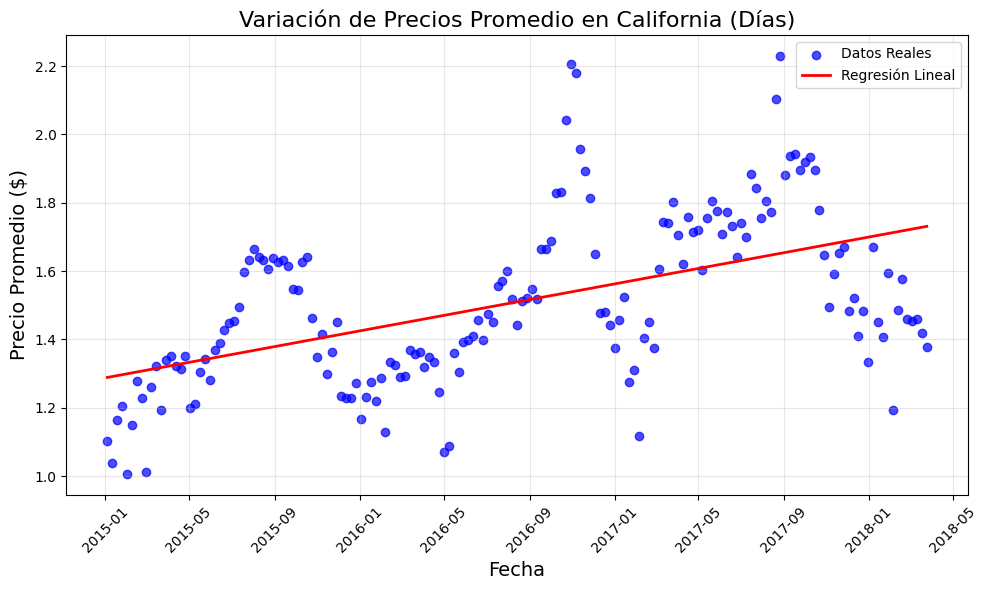

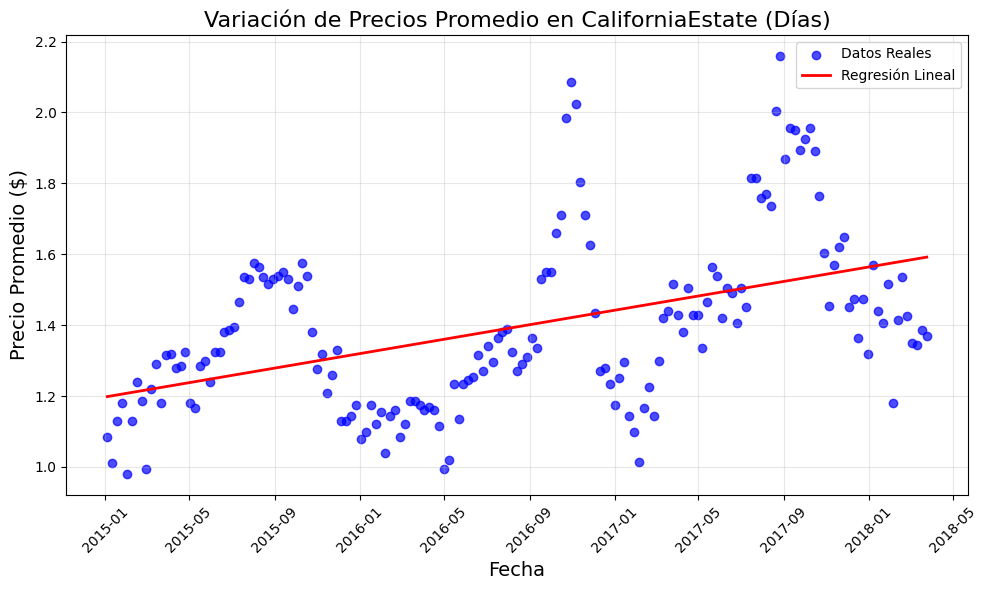

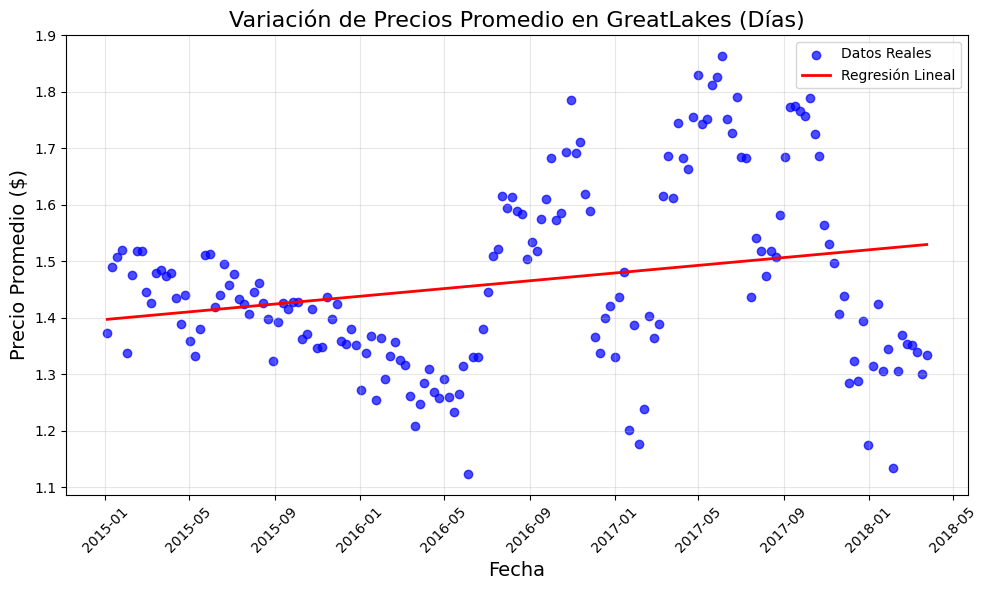

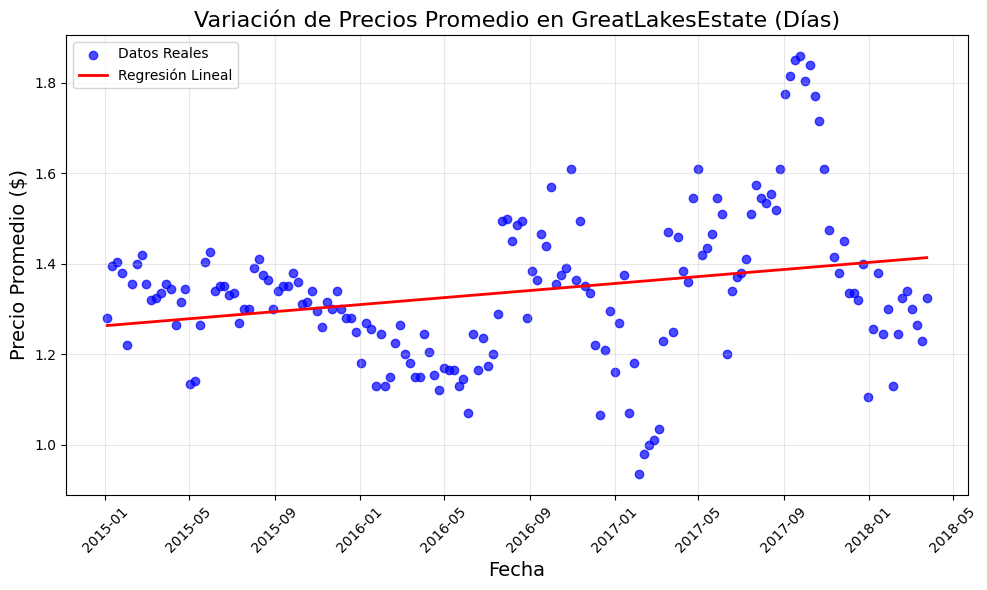

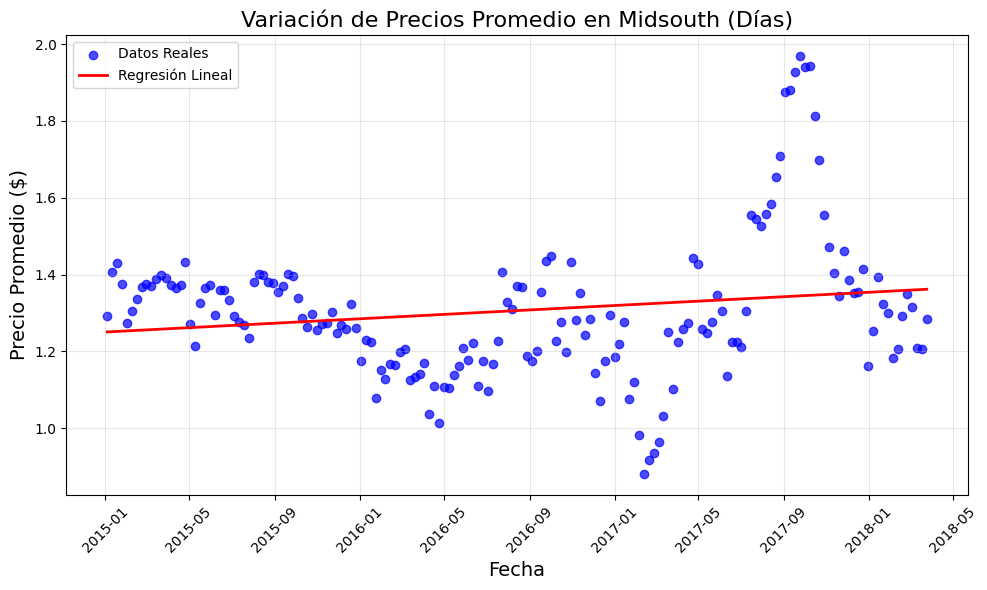

...

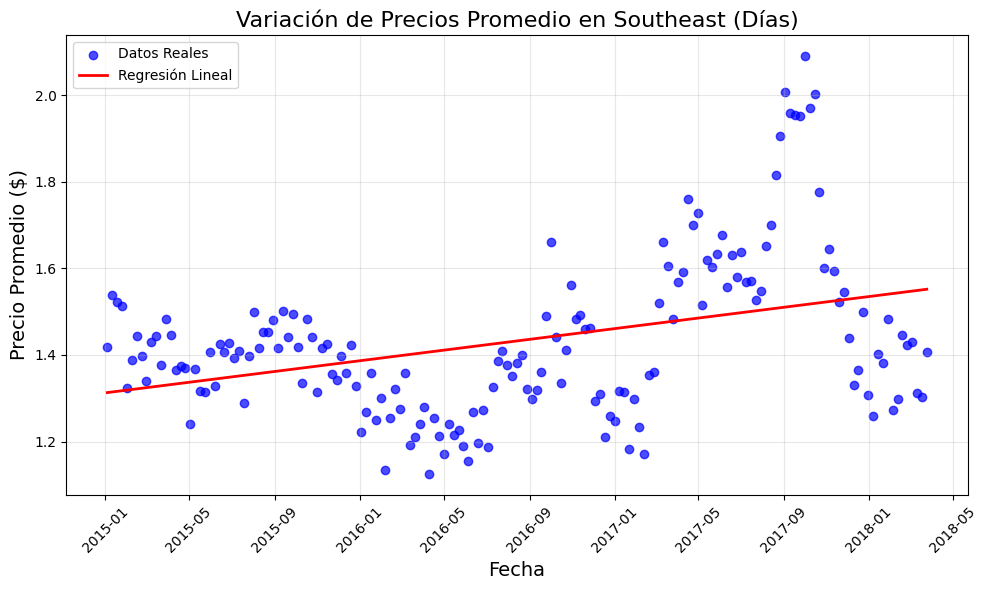

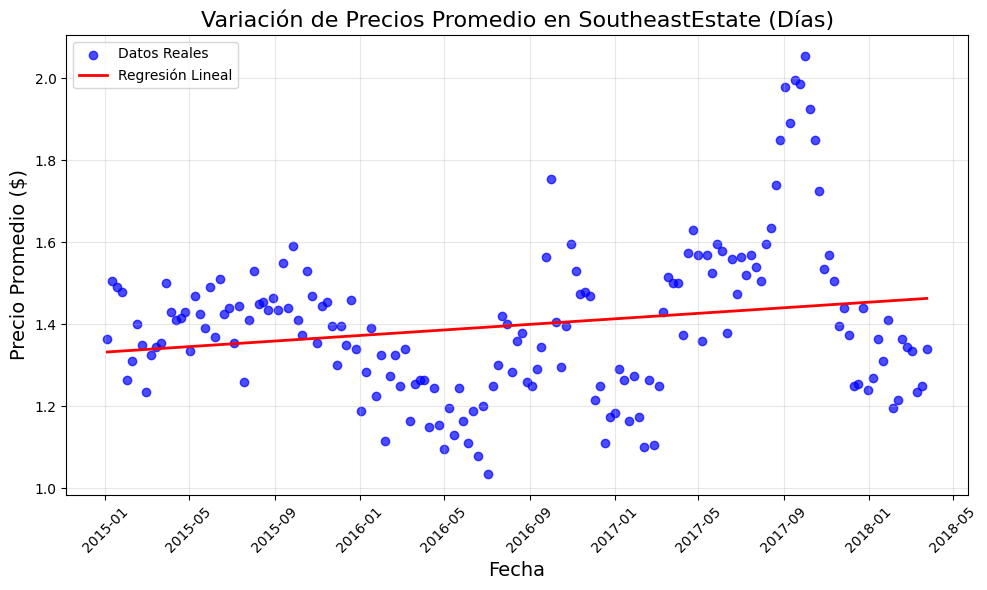

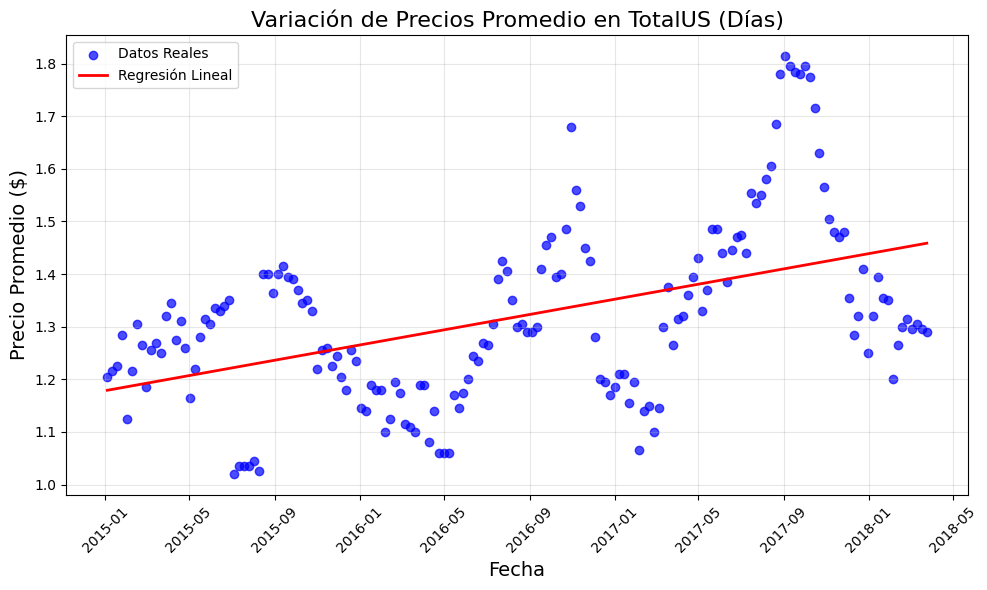

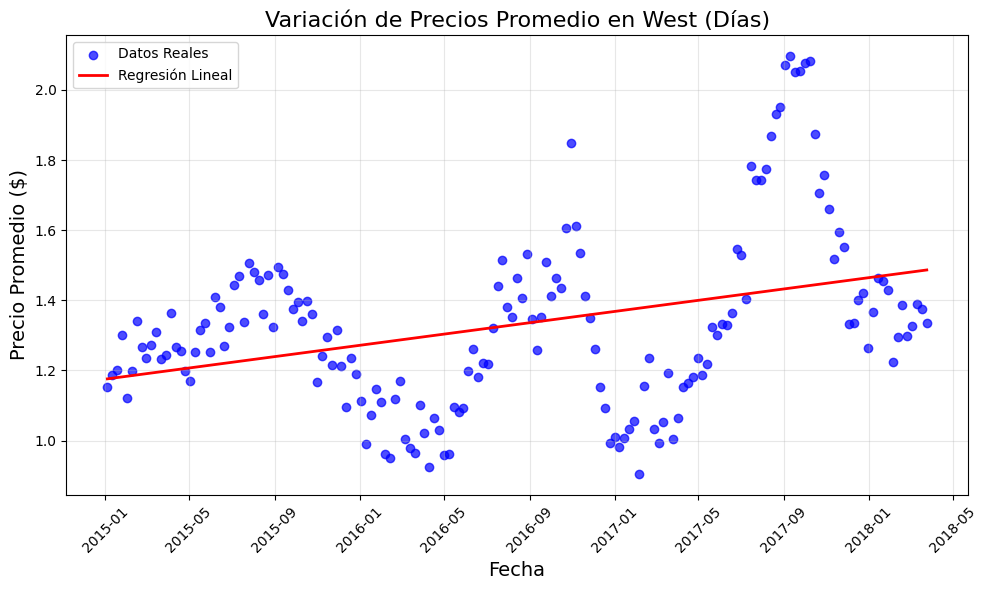

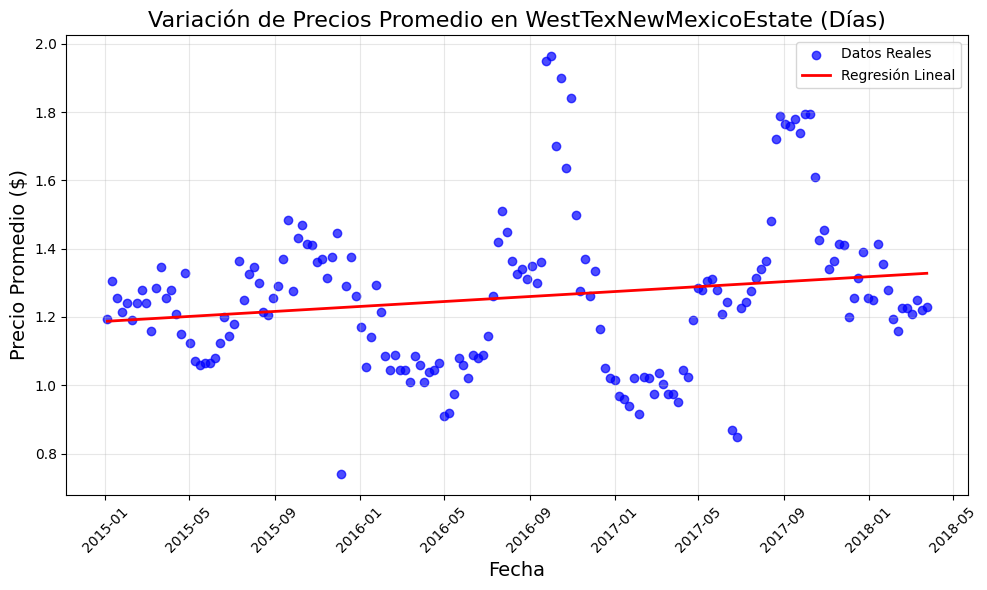

In [3]:
# Cargar datos y preparar
advocado_data['Date_Num'] = advocado_data['Date'].map(pd.Timestamp.toordinal)

# Iterar por frecuencias y etiquetas
for freq, label in zip(frequencies, frequency_labels):
    # Agrupar por broad_region y frecuencia de tiempo
    grouped_data = advocado_data.groupby(['broad_region', pd.Grouper(key='Date', freq=freq)]).agg(
        AveragePrice=('AveragePrice', 'mean')
    ).reset_index()

    # Obtener las broad regions únicas
    broad_regions = grouped_data['broad_region'].unique()

    # Crear gráficos de dispersión para cada broad region
    for broad_region in broad_regions:
        # Filtrar datos de la región
        region_data = grouped_data[grouped_data['broad_region'] == broad_region].copy()
        
        # Convertir fechas a formato numérico y aplicar logaritmo
        region_data['Date_Num'] = region_data['Date'].map(pd.Timestamp.toordinal)
        X = np.log(region_data[['Date_Num']].values)  # Logaritmo de las fechas
        y = region_data['AveragePrice'].values

        # Entrenar el modelo de regresión lineal
        model = LinearRegression()
        model.fit(X, y)

        # Generar predicciones
        region_data['Predicted'] = model.predict(X)

        # Crear el gráfico de dispersión y la curva de regresión
        plt.figure(figsize=(10, 6))
        plt.scatter(region_data['Date'], region_data['AveragePrice'], alpha=0.7, label='Datos Reales', color='blue')
        plt.plot(region_data['Date'], region_data['Predicted'], color='red', label='Regresión Lineal', linewidth=2)
        plt.title(f'Variación de Precios Promedio en {broad_region} ({label})', fontsize=16)
        plt.xlabel('Fecha', fontsize=14)
        plt.ylabel('Precio Promedio ($)', fontsize=14)
        plt.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()



###### EXPLICACIÓN
dakfjdsaldfkjalkjdsalkjdflk

### REGRESIÓN POLINÓMICA DE DISTINTO GRADO POR ZONAS

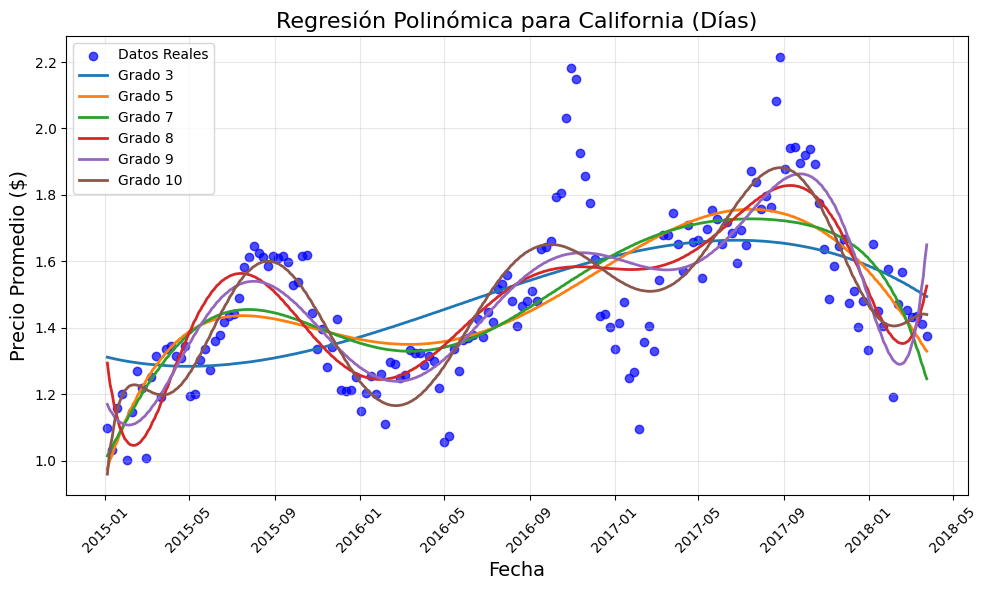

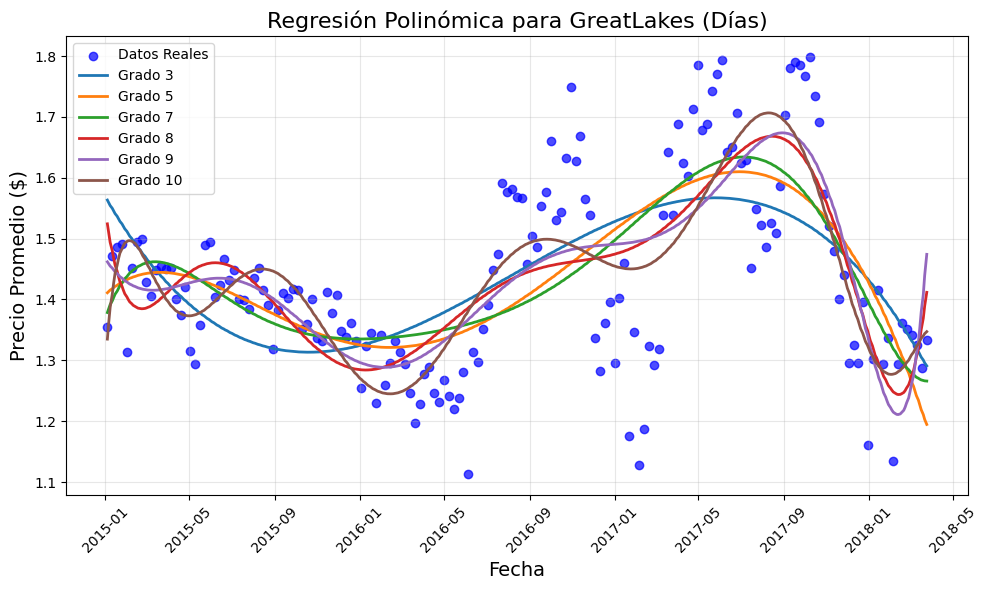

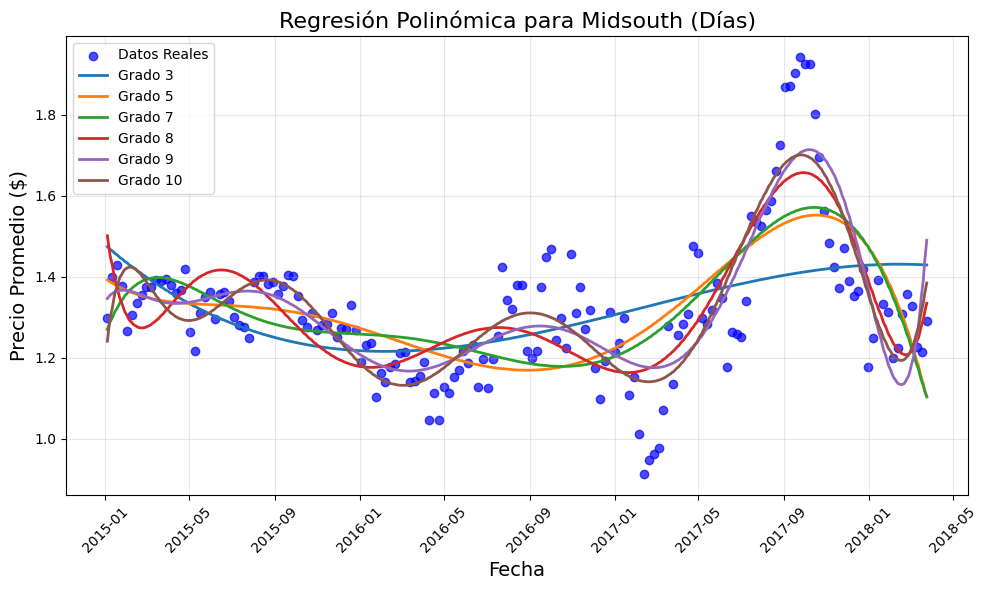

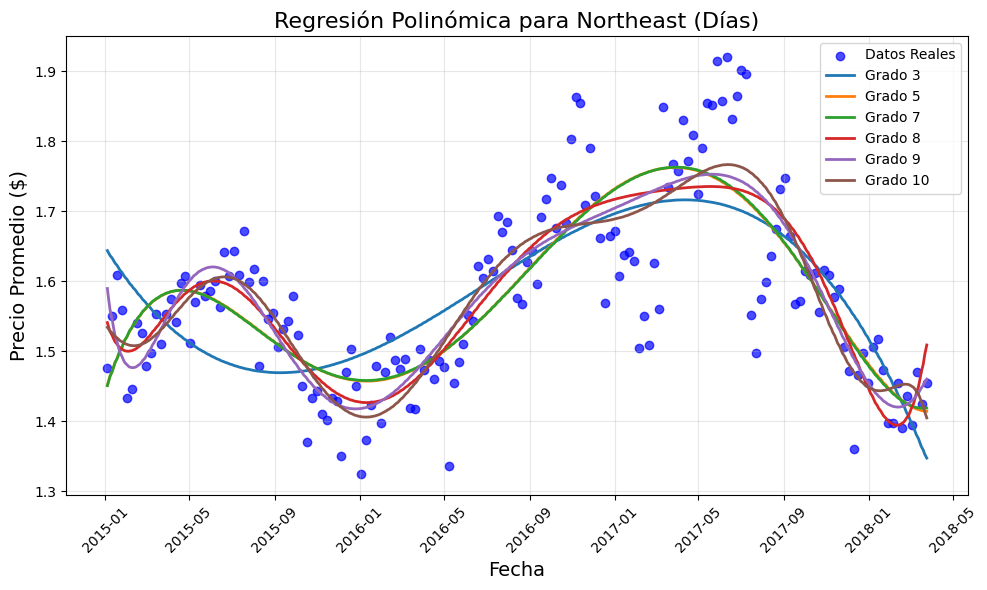

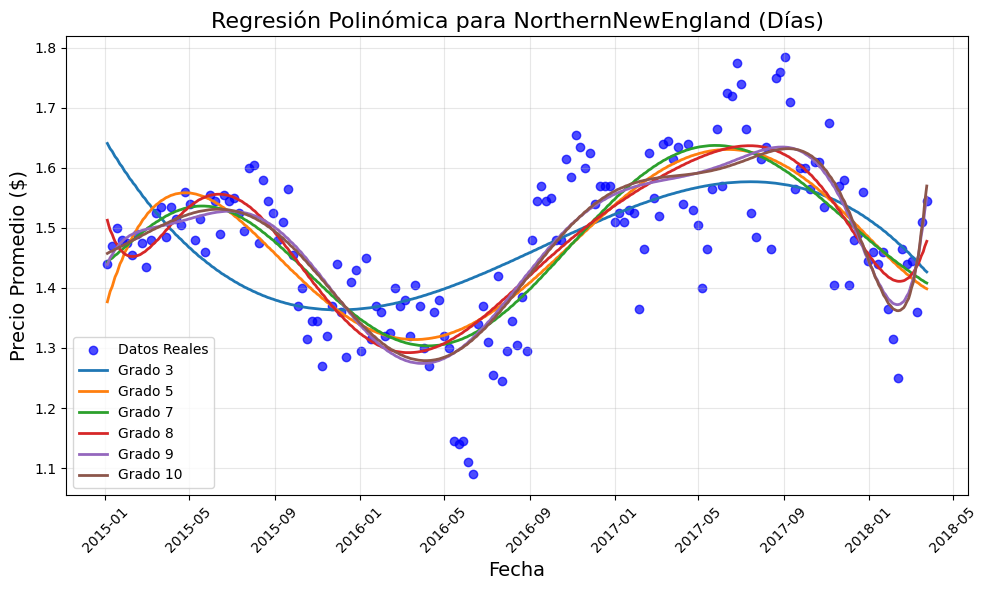

...

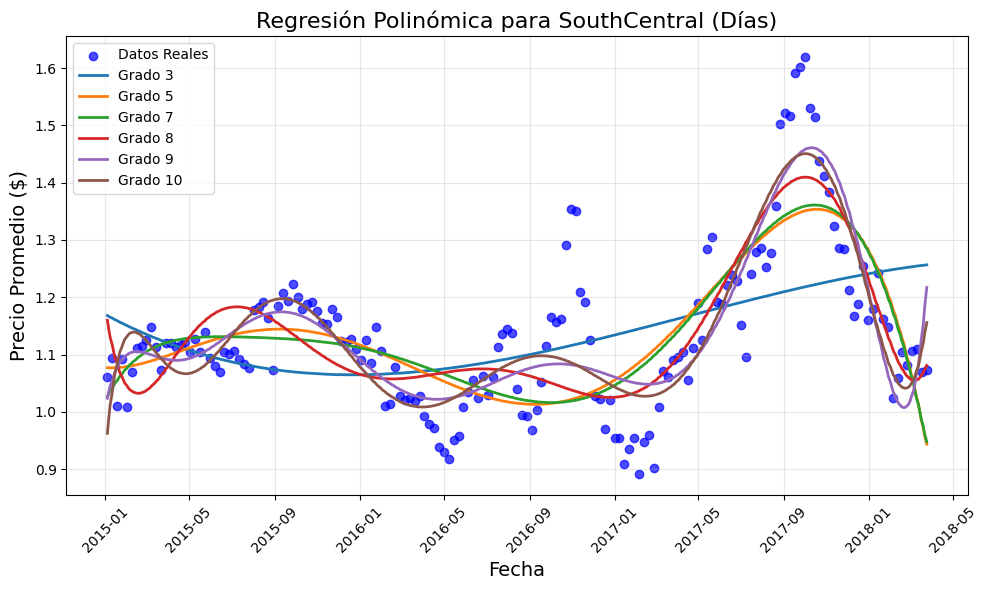

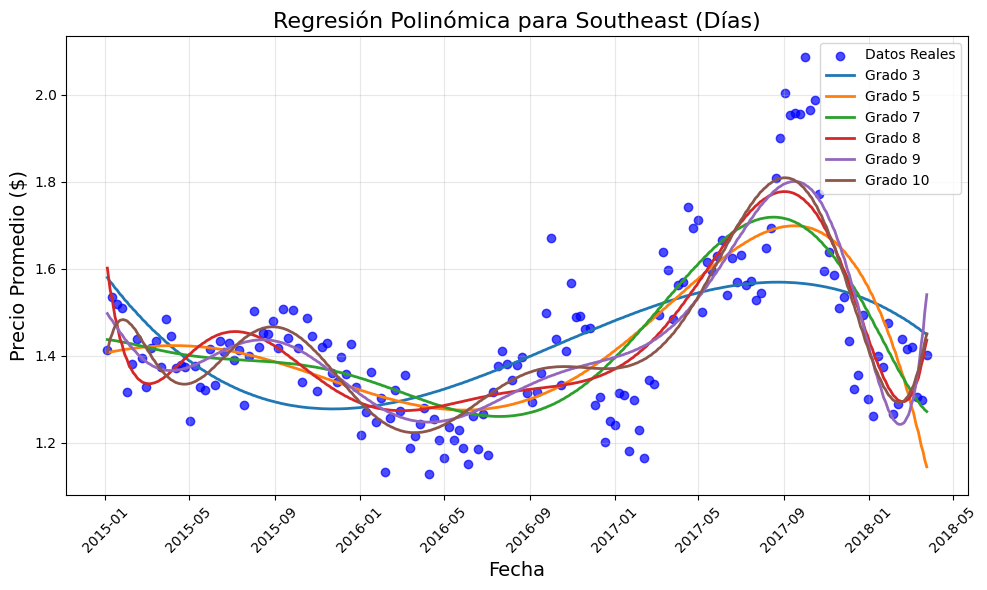

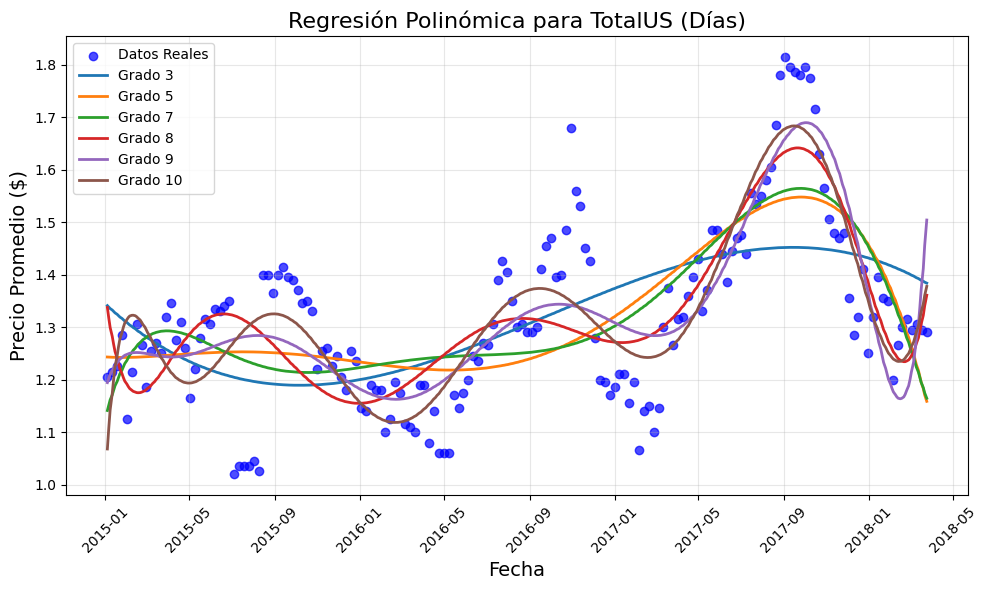

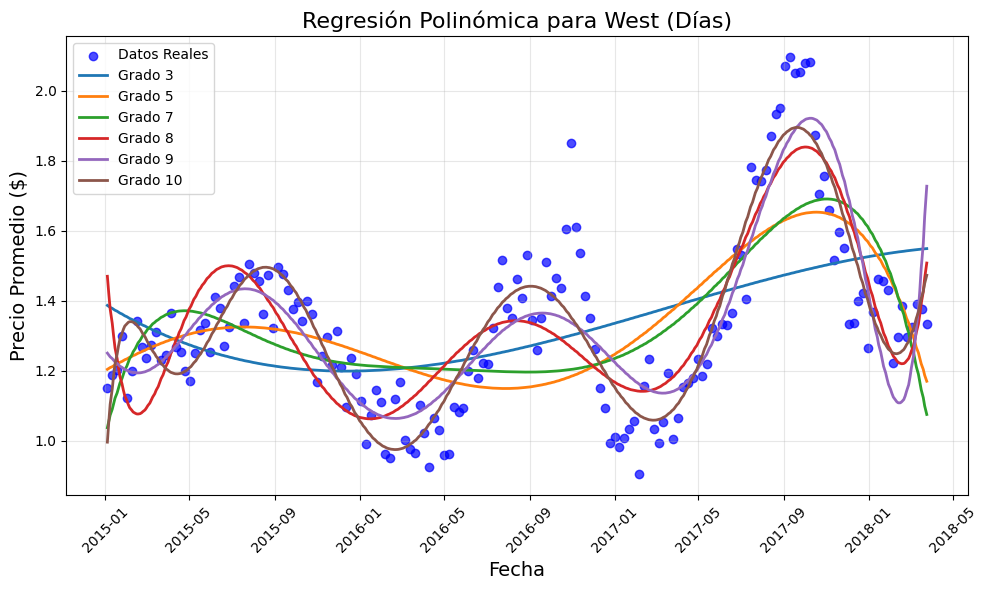

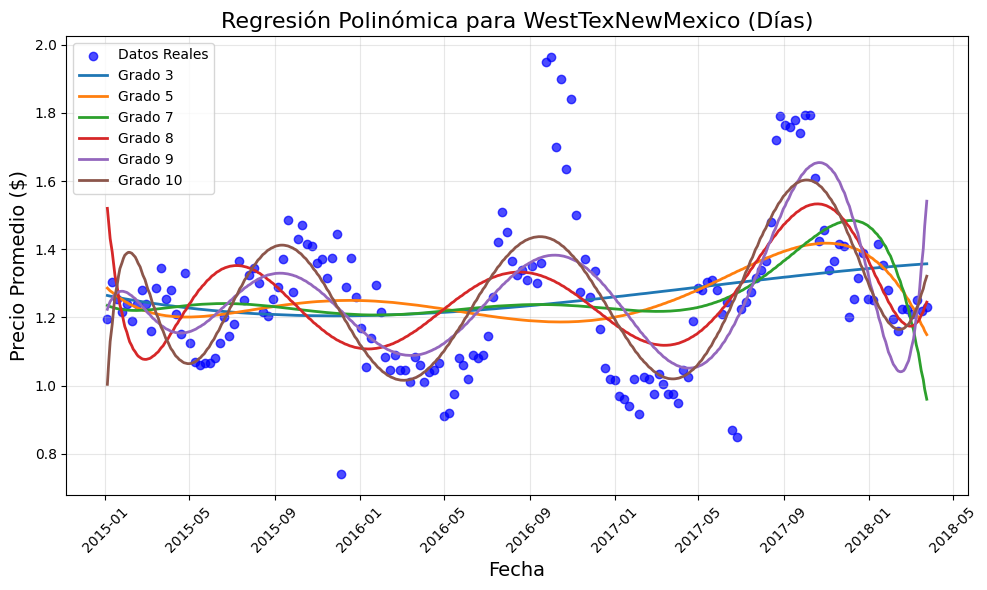

In [23]:
# Convertir la columna 'Date' a numérico (ordinal)
advocado_data['Date_Num'] = advocado_data['Date'].map(pd.Timestamp.toordinal)

# Determinar el origen dinámico basado en el primer día de los datos
origin_date = advocado_data['Date'].min()

# Iterar por frecuencias y etiquetas
for freq, label in zip(frequencies, frequency_labels):
    # Agrupar por broad_region y frecuencia de tiempo
    grouped_data = advocado_data.groupby(['broad_region', pd.Grouper(key='Date', freq=freq)]).agg(
        AveragePrice=('AveragePrice', 'mean')
    ).reset_index()

    # Obtener las broad regions únicas
    broad_regions = grouped_data['broad_region'].unique()

    # Crear gráficos de dispersión para cada broad region
    for broad_region in broad_regions:
        # Filtrar datos de la región
        region_data = grouped_data[grouped_data['broad_region'] == broad_region].copy()
        
        # Convertir fechas a formato numérico
        region_data['Date_Num'] = region_data['Date'].map(pd.Timestamp.toordinal)
        # x fechas 
        X = region_data[['Date_Num']].values
        # y average price
        y = region_data['AveragePrice'].values

        # Escalar las fechas
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Generar un rango continuo de fechas para la predicción
        date_range = np.linspace(region_data['Date_Num'].min(), region_data['Date_Num'].max(), 500).reshape(-1, 1)
        date_range_scaled = scaler.transform(date_range)

        # Crear el gráfico de dispersión
        plt.figure(figsize=(10, 6))
        plt.scatter(region_data['Date'], region_data['AveragePrice'], alpha=0.7, label='Datos Reales', color='blue')

        # Probar diferentes grados de polinomio
        for degree in [3, 5, 7,8,9,10]:
            # Crear el modelo polinómico con el grado actual
            poly = PolynomialFeatures(degree=degree)
            X_poly = poly.fit_transform(X_scaled)

            # Entrenar el modelo de regresión lineal con las características polinómicas
            model = LinearRegression()
            model.fit(X_poly, y)

            # Transformar el rango continuo de fechas
            date_range_poly = poly.transform(date_range_scaled)
            predicted_prices = model.predict(date_range_poly)

            # Reconstruir las fechas usando el rango de fechas original
            date_range_datetime = [origin_date + pd.Timedelta(days=int(num - region_data['Date_Num'].min())) for num in date_range.flatten()]

            # Graficar la curva de predicción
            plt.plot(date_range_datetime, predicted_prices, label=f'Grado {degree}', linewidth=2)

        # Configurar el gráfico
        plt.title(f'Regresión Polinómica para {broad_region} ({label})', fontsize=16)
        plt.xlabel('Fecha', fontsize=14)
        plt.ylabel('Precio Promedio ($)', fontsize=14)
        plt.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.legend()
        plt.tight_layout()
        plt.show()



#### EXPLICACIÓN

### EXTRAPOLACIÓN 

#### INTENTO 1
CON REGRESIÓN POLINÓMICA

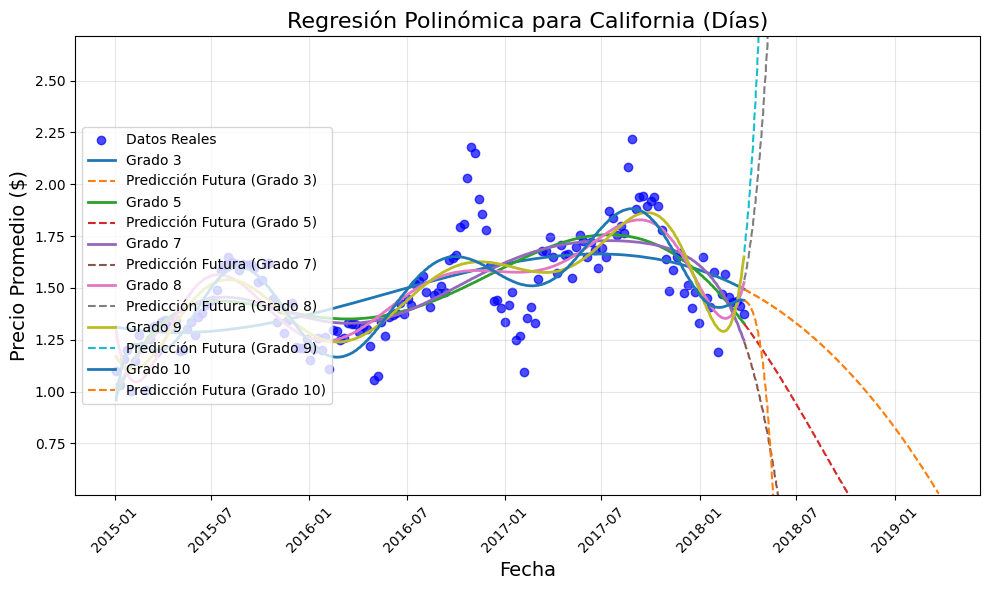

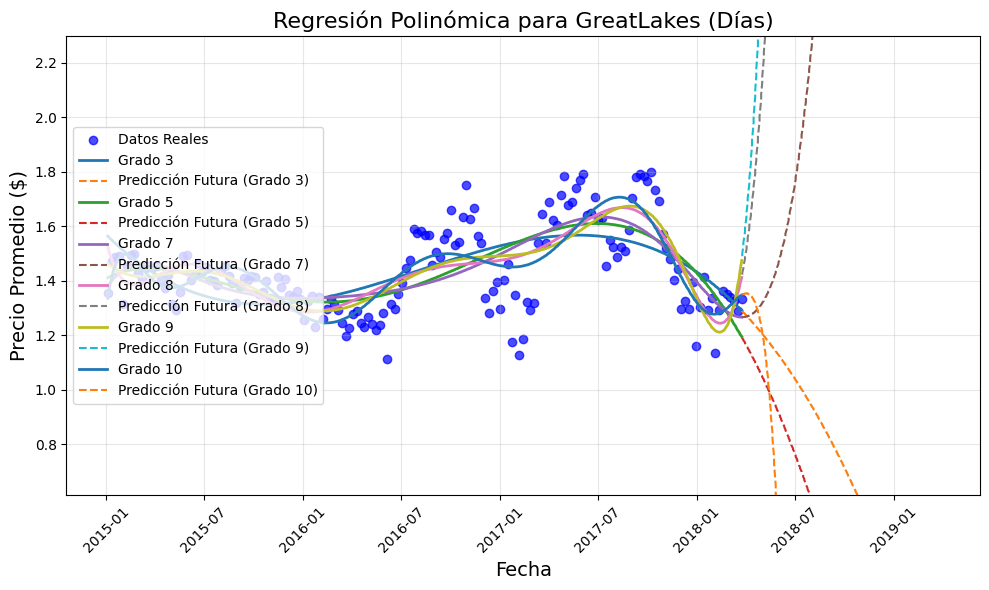

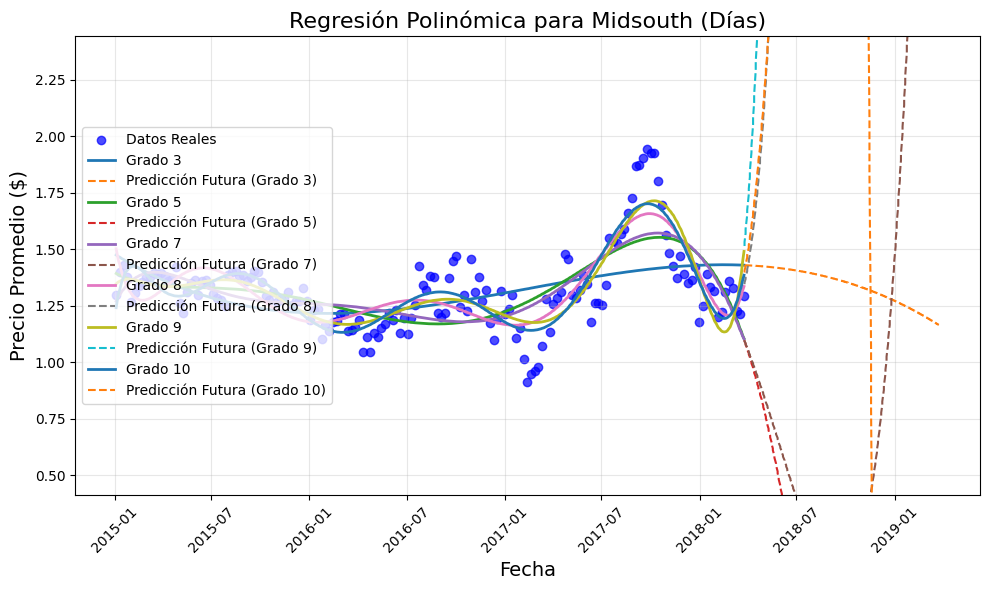

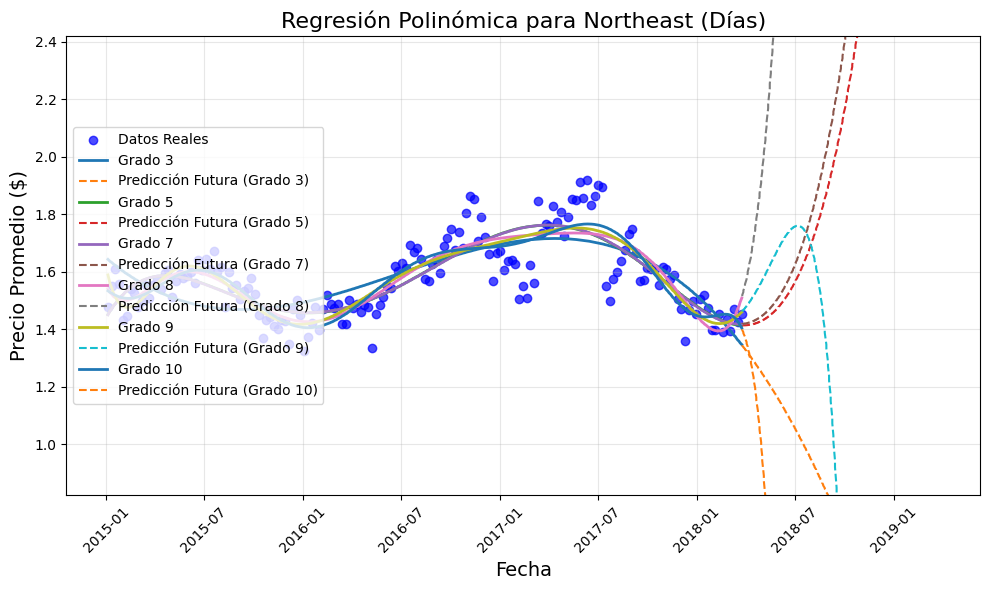

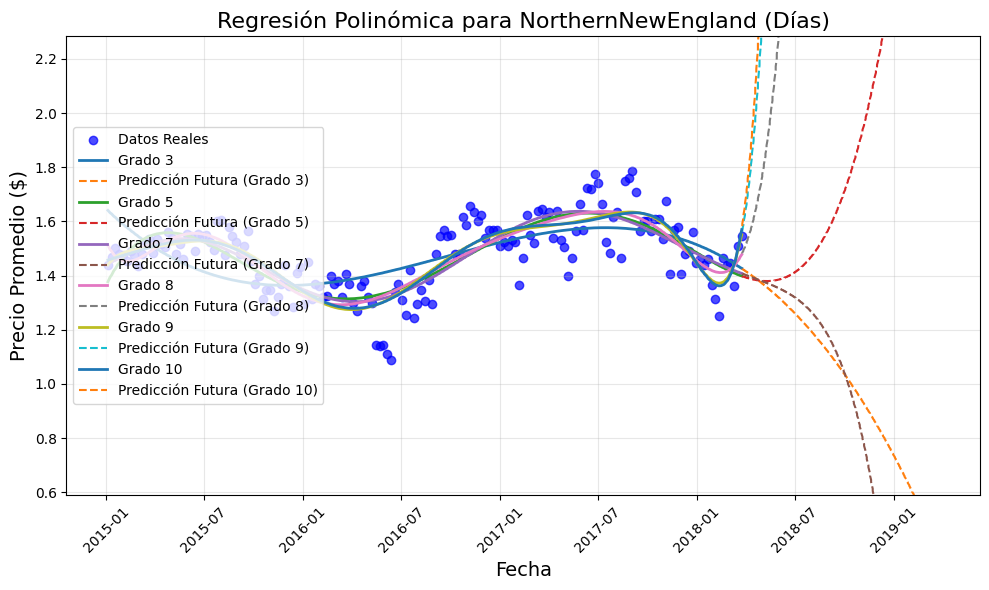

...

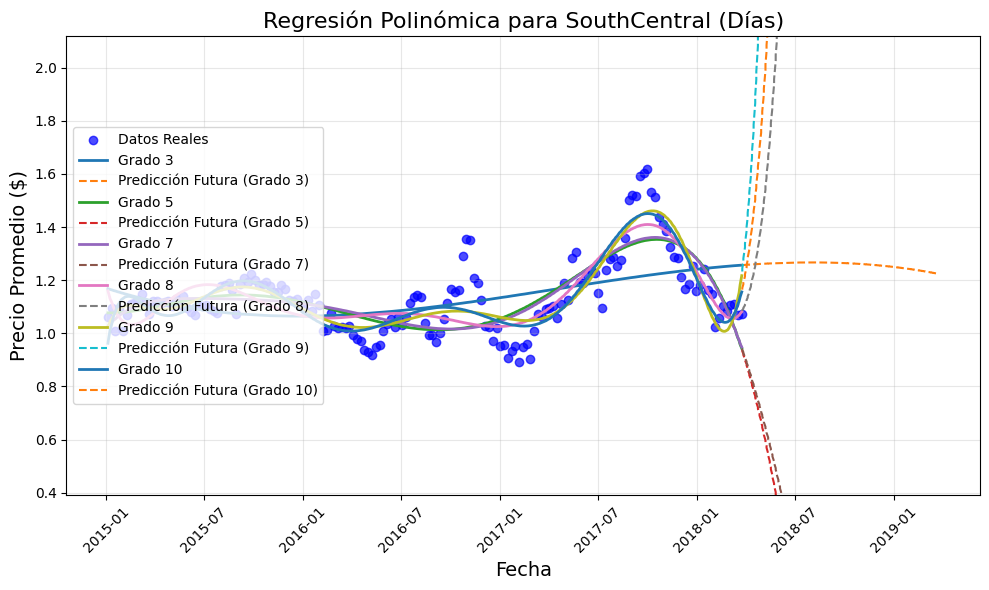

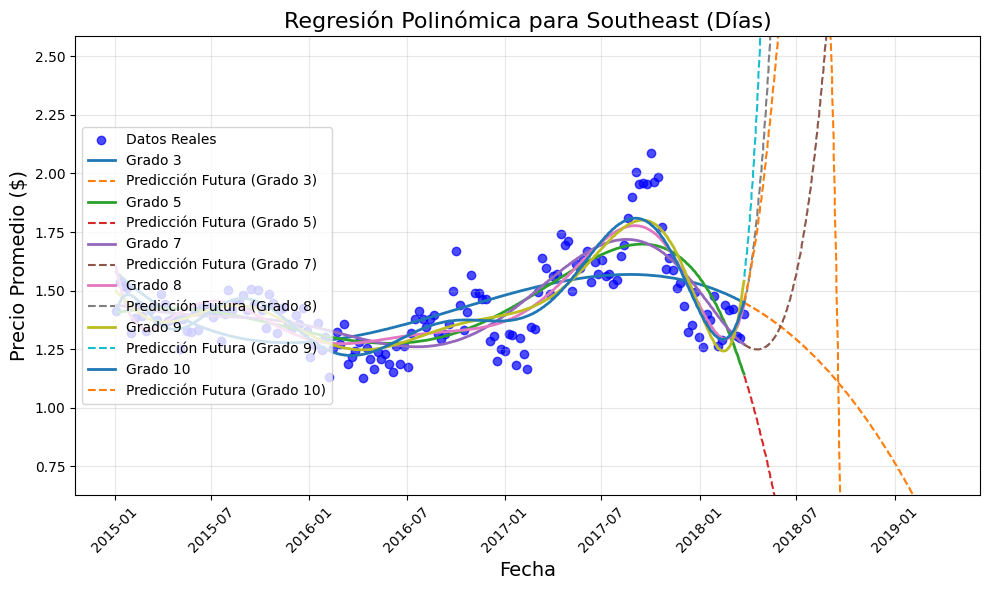

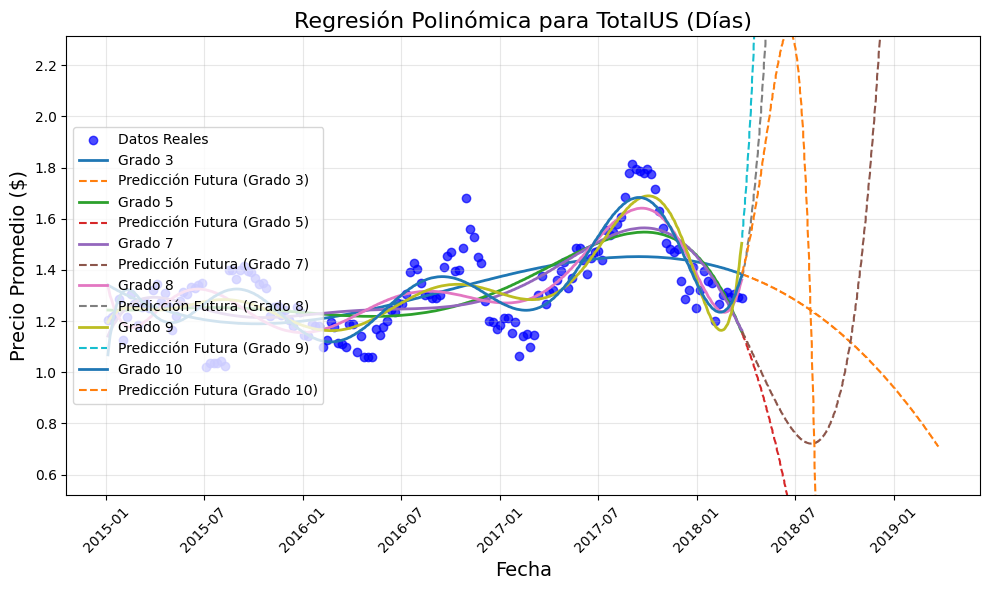

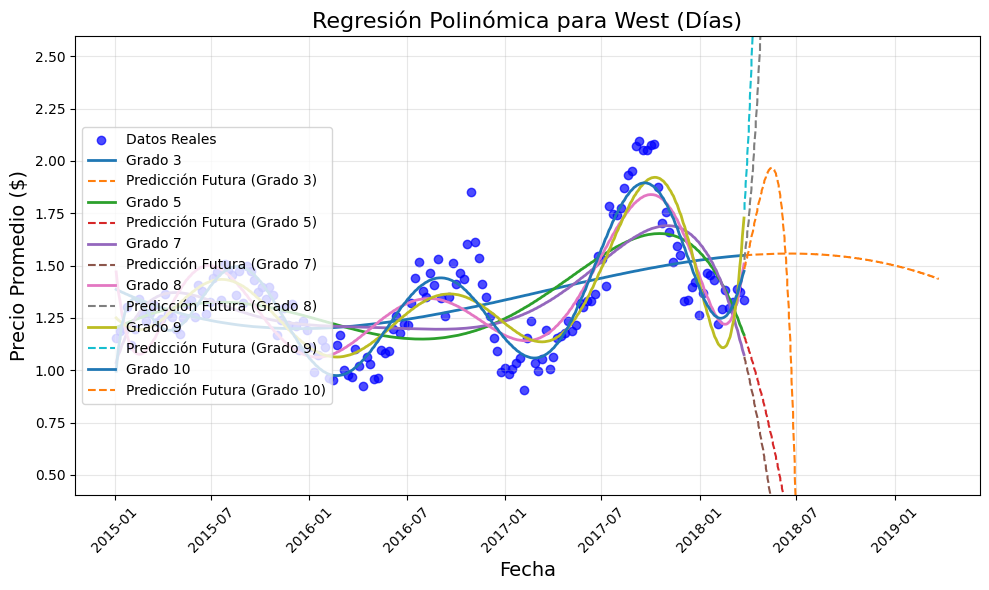

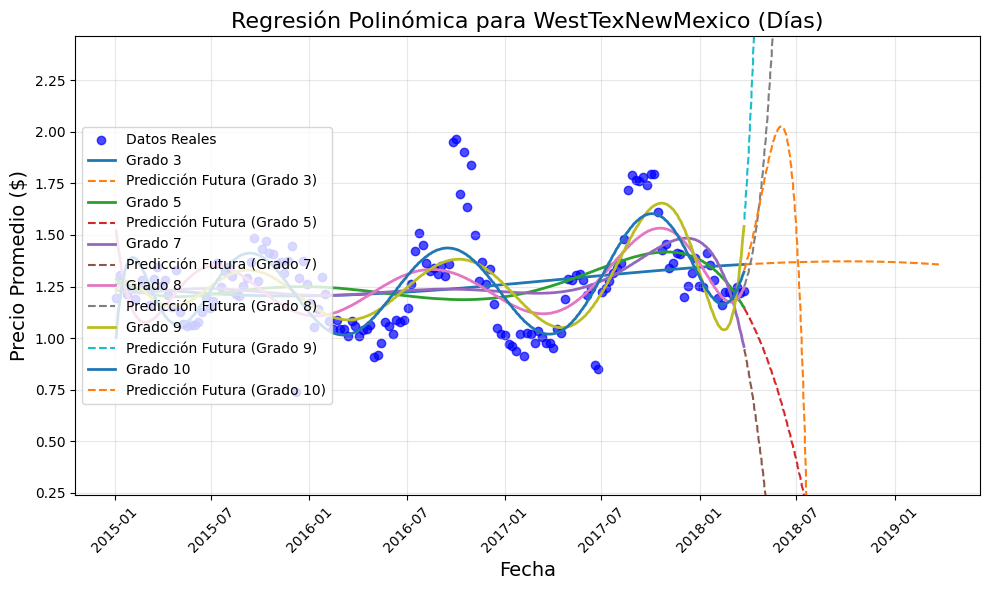

In [31]:
#  columna 'Date' a numérico (ordinal)
advocado_data['Date_Num'] = advocado_data['Date'].map(pd.Timestamp.toordinal)

# Determinar el origen dinámico basado en el primer día de los datos
origin_date = advocado_data['Date'].min()

# Iterar por frecuencias y etiquetas
for freq, label in zip(frequencies, frequency_labels):
    # Agrupar por broad_region y frecuencia de tiempo
    grouped_data = advocado_data.groupby(['broad_region', pd.Grouper(key='Date', freq=freq)]).agg(
        AveragePrice=('AveragePrice', 'mean')
    ).reset_index()

    # Obtener las broad regions únicas
    broad_regions = grouped_data['broad_region'].unique()

    # Crear gráficos de dispersión para cada broad region
    for broad_region in broad_regions:
        # Filtrar datos de la región
        region_data = grouped_data[grouped_data['broad_region'] == broad_region].copy()
        
        # Convertir fechas a formato numérico
        region_data['Date_Num'] = region_data['Date'].map(pd.Timestamp.toordinal)
        X = region_data[['Date_Num']].values
        y = region_data['AveragePrice'].values

        # Escalar las fechas
        scaler = StandardScaler()
        X_scaled = scaler.fit_transform(X)

        # Generar un rango continuo de fechas para la predicción
        date_range = np.linspace(region_data['Date_Num'].min(), region_data['Date_Num'].max(), 500).reshape(-1, 1)
        date_range_scaled = scaler.transform(date_range)

        # Extender fechas para predicciones futuras (1 año adicional)
        future_dates = np.linspace(region_data['Date_Num'].max() + 1, region_data['Date_Num'].max() + 365, 500).reshape(-1, 1)
        future_dates_scaled = scaler.transform(future_dates)

       # Crear el gráfico de dispersión
        plt.figure(figsize=(10, 6))
        plt.scatter(region_data['Date'], region_data['AveragePrice'], alpha=0.7, label='Datos Reales', color='blue')

        # Probar diferentes grados de polinomio
        for degree in [3, 5, 7, 8 ,9,10]:
            # Crear el modelo polinómico con el grado actual
            poly = PolynomialFeatures(degree=degree)
            X_poly = poly.fit_transform(X_scaled)

            # Entrenar el modelo de regresión lineal con las características polinómicas
            model = LinearRegression()
            model.fit(X_poly, y)

            # Transformar el rango continuo de fechas
            date_range_poly = poly.transform(date_range_scaled)
            predicted_prices = model.predict(date_range_poly)

            # Predicciones futuras
            future_dates_poly = poly.transform(future_dates_scaled)
            future_predictions = model.predict(future_dates_poly)

            # Reconstruir las fechas usando el rango extendido
            date_range_datetime = [origin_date + pd.Timedelta(days=int(num - region_data['Date_Num'].min())) for num in date_range.flatten()]
            future_dates_datetime = [origin_date + pd.Timedelta(days=int(num - region_data['Date_Num'].min())) for num in future_dates.flatten()]

            # Graficar la curva de predicción
            plt.plot(date_range_datetime, predicted_prices, label=f'Grado {degree}', linewidth=2)
            plt.plot(future_dates_datetime, future_predictions, linestyle='dashed', label=f'Predicción Futura (Grado {degree})')

        # Configurar el gráfico
        plt.title(f'Regresión Polinómica para {broad_region} ({label})', fontsize=16)
        plt.xlabel('Fecha', fontsize=14)
        plt.ylabel('Precio Promedio ($)', fontsize=14)
        plt.grid(alpha=0.3)
        plt.xticks(rotation=45)
        plt.ylim(region_data['AveragePrice'].min() - 0.5, region_data['AveragePrice'].max() + 0.5)  # Ajustar rango dinámico del eje y
        plt.legend(loc='center left')
        plt.tight_layout()
        plt.show()



##### EXPLICACIÓN


### CON SERIES DE FOURIER

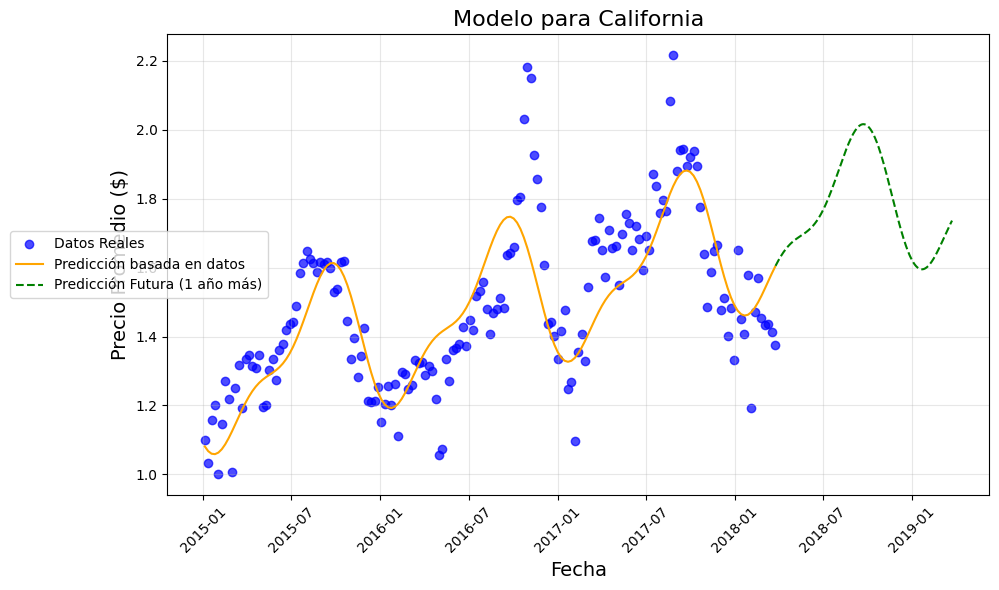

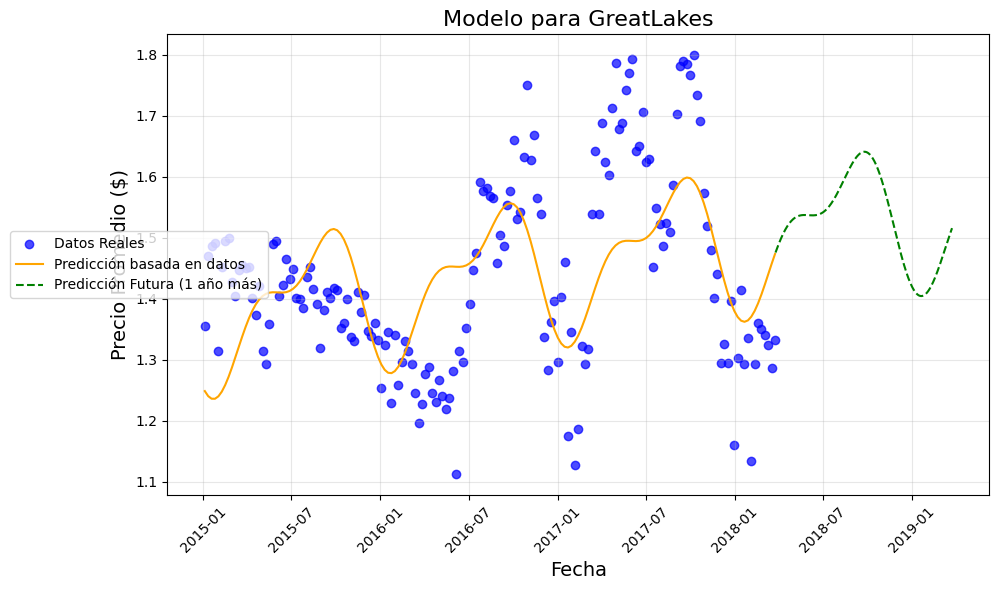

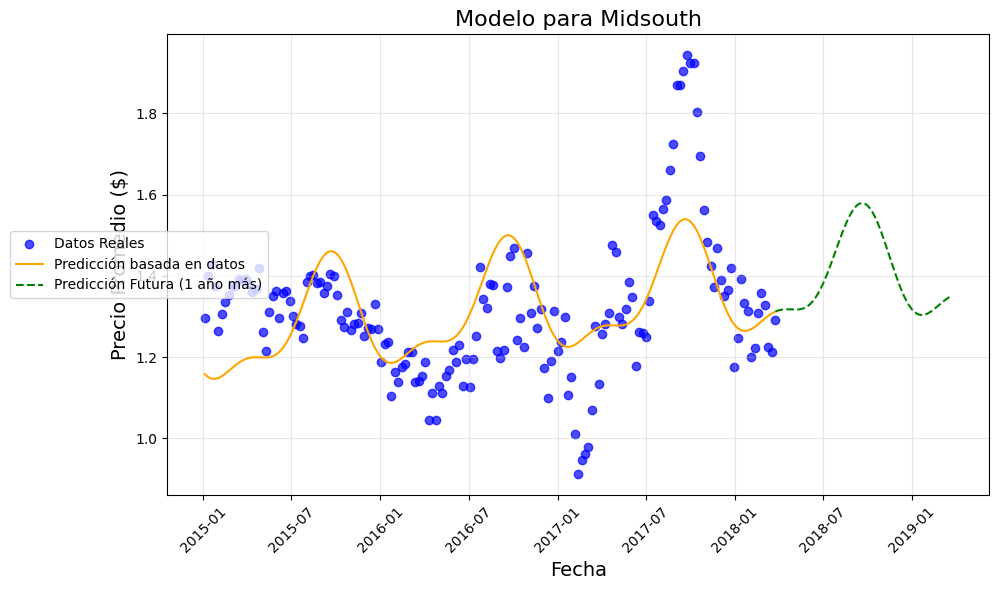

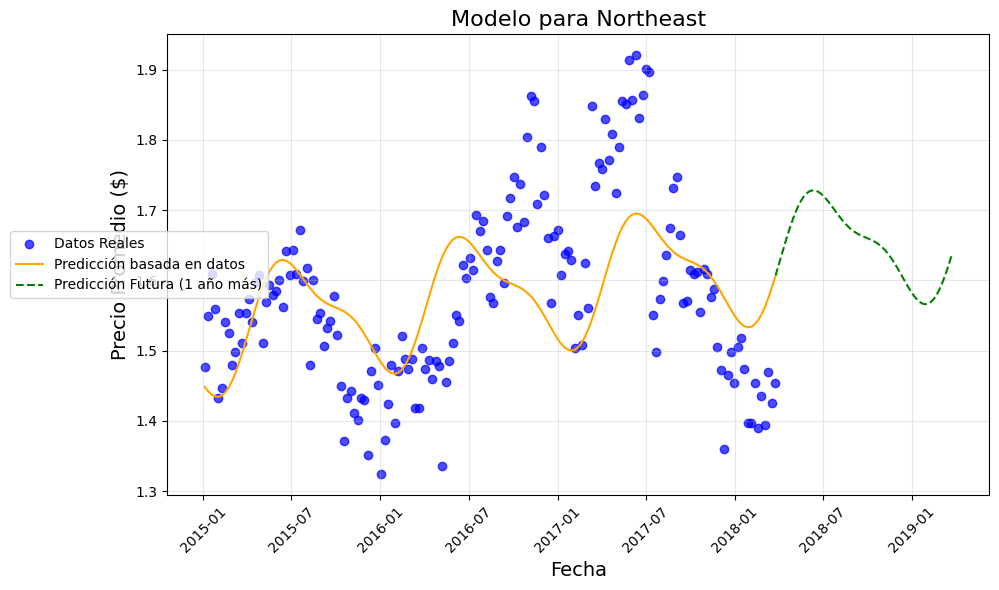

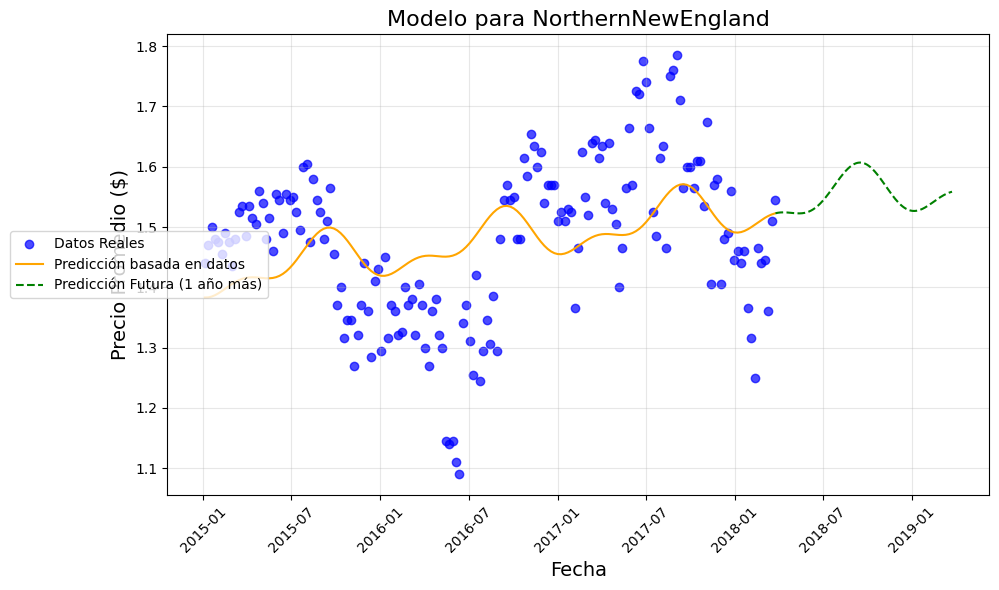

...

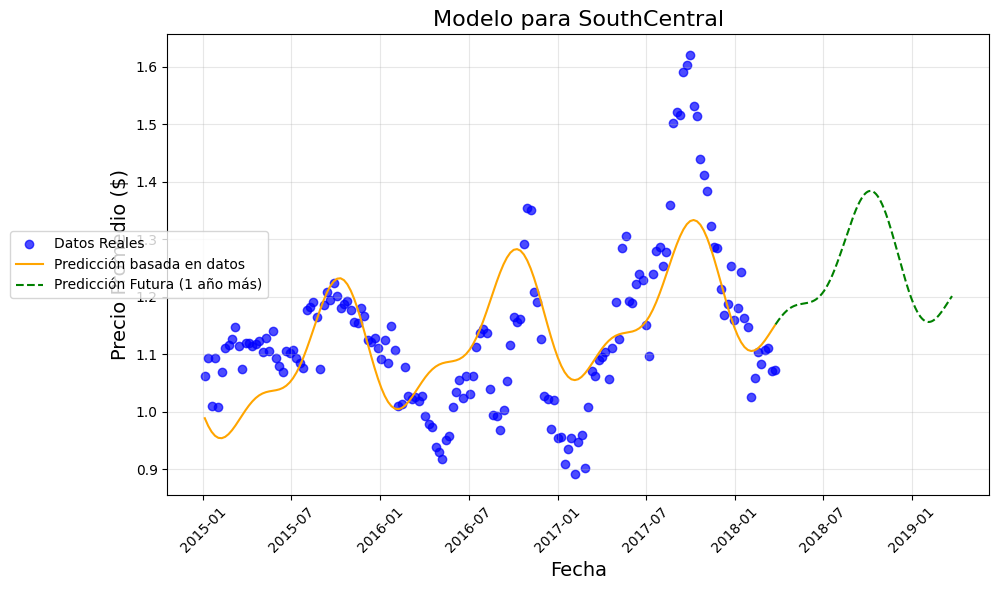

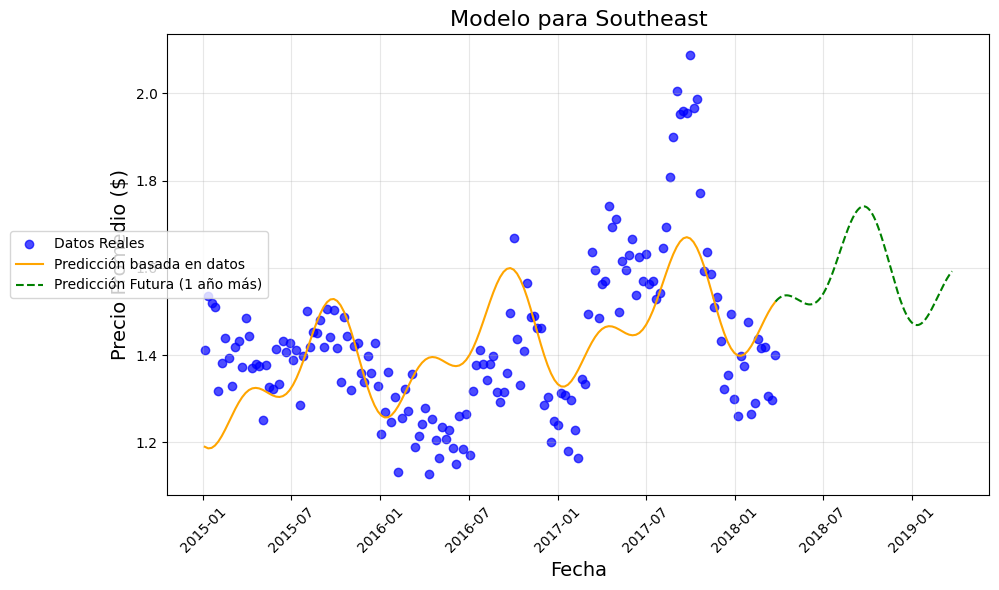

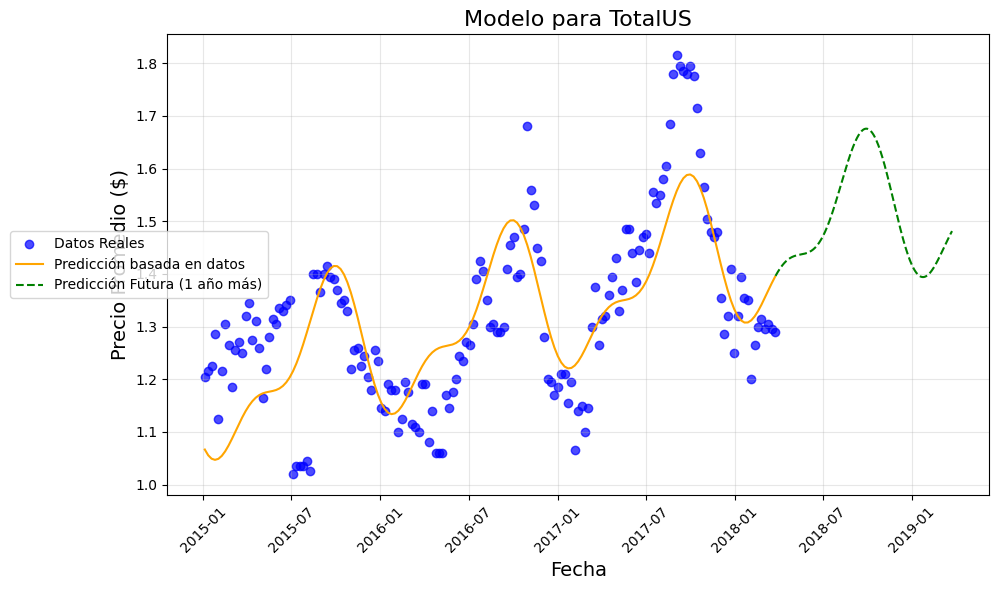

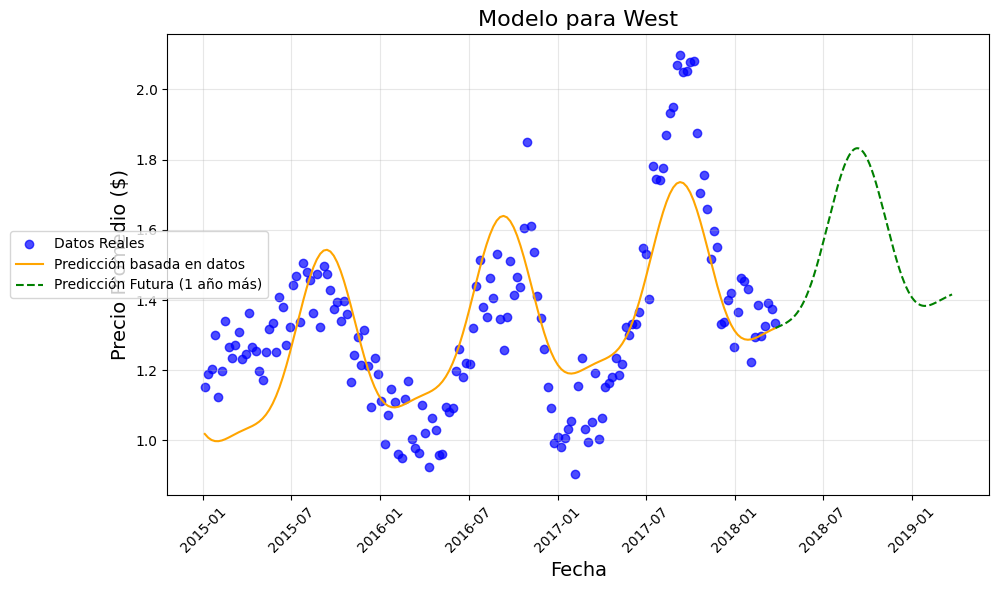

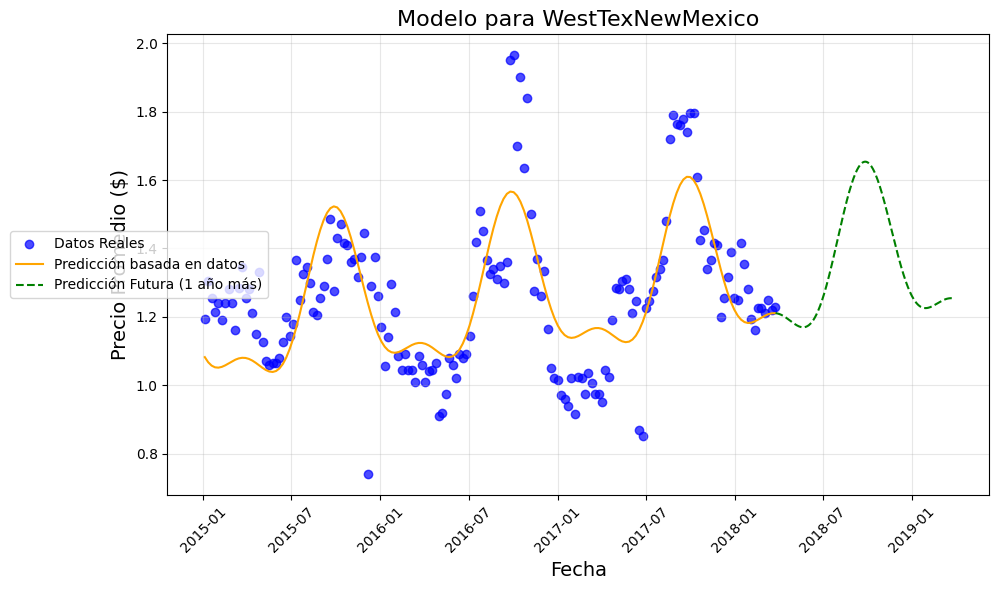

In [ ]:
# Iterar por cada región
for broad_region in broad_regions:
    # Filtrar datos de la región
    region_data = grouped_data[grouped_data['broad_region'] == broad_region].copy()

    # Preparar datos
    region_data['Time'] = (region_data['Date'] - region_data['Date'].min()).dt.days  # Tiempo en días desde el inicio
    X = region_data['Time'].values  # Variable de tiempo
    y = region_data['AveragePrice'].values  # Precios promedio

    # Ajustar la tendencia (lineal)
    def linear_trend(t, a, b):
        return a * t + b

    params_trend, _ = curve_fit(linear_trend, X, y)
    trend_fitted = linear_trend(X, *params_trend)

    # Ajustar la estacionalidad (términos de Fourier)
    def seasonal_fourier(t, a1, b1, a2, b2):
        P = 365  # Periodo anual
        return (
            a1 * np.sin(2 * np.pi * t / P) + b1 * np.cos(2 * np.pi * t / P) +
            a2 * np.sin(4 * np.pi * t / P) + b2 * np.cos(4 * np.pi * t / P)
        )

    params_seasonal, _ = curve_fit(seasonal_fourier, X, y - trend_fitted)
    seasonal_fitted = seasonal_fourier(X, *params_seasonal)

    # Generar predicciones futuras
    future_time = np.arange(X.max() + 1, X.max() + 366)  # Un año adicional
    future_trend = linear_trend(future_time, *params_trend)
    future_seasonal = seasonal_fourier(future_time, *params_seasonal)
    future_predicted = future_trend + future_seasonal

    # Reconstruir fechas futuras
    future_dates = [region_data['Date'].min() + pd.Timedelta(days=int(t)) for t in future_time]

    # Crear gráfico
    plt.figure(figsize=(10, 6))

    # Gráficos de datos históricos
    plt.scatter(region_data['Date'], y, alpha=0.7, label='Datos Reales', color='blue')
    plt.plot(region_data['Date'], trend_fitted + seasonal_fitted, label='Predicción basada en datos', color='orange')

    # Gráficos de predicciones futuras
    plt.plot(future_dates, future_predicted, label='Predicción Futura (1 año más)', linestyle='--', color='green')

    # Configurar el gráfico
    plt.title(f'Modelo para {broad_region}', fontsize=16)
    plt.xlabel('Fecha', fontsize=14)
    plt.ylabel('Precio Promedio ($)', fontsize=14)
    plt.grid(alpha=0.3)
    plt.xticks(rotation=45)
    plt.legend(loc='center left', bbox_to_anchor=(-0.2, 0.5))  
    plt.tight_layout()
    plt.show()

EXPLICACIÓN

### EXTRAPOLACIÓN CON PROPHET

21:19:38 - cmdstanpy - INFO - Chain [1] start processing
21:19:38 - cmdstanpy - INFO - Chain [1] done processing


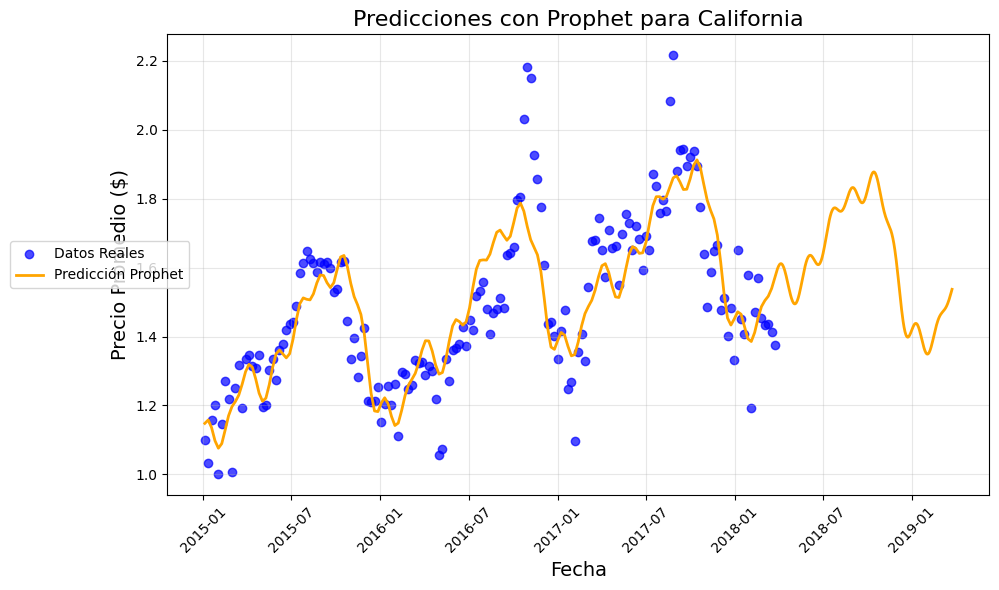

21:19:39 - cmdstanpy - INFO - Chain [1] start processing
21:19:39 - cmdstanpy - INFO - Chain [1] done processing


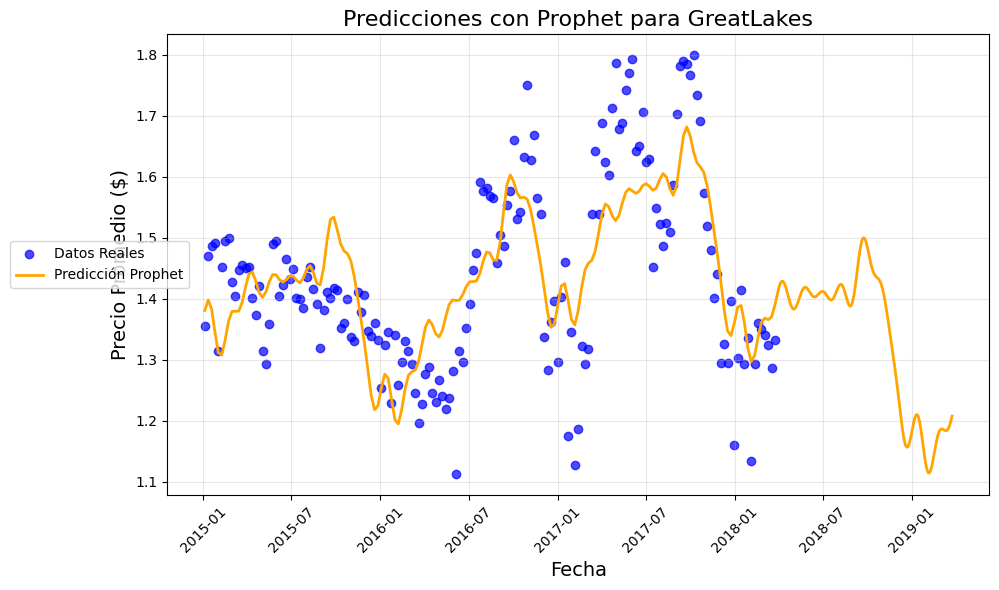

21:19:39 - cmdstanpy - INFO - Chain [1] start processing
21:19:39 - cmdstanpy - INFO - Chain [1] done processing


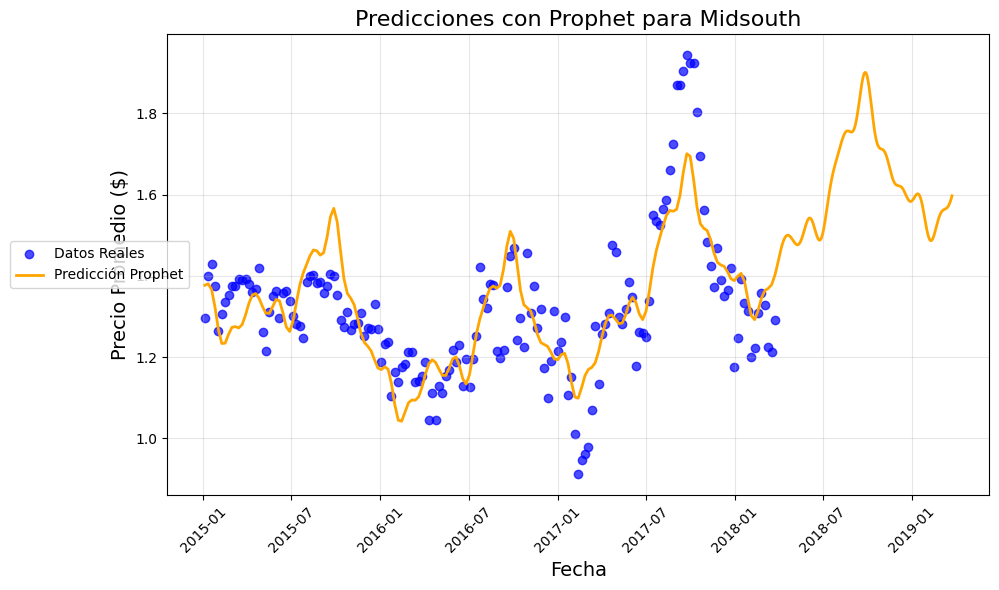

21:19:40 - cmdstanpy - INFO - Chain [1] start processing
21:19:40 - cmdstanpy - INFO - Chain [1] done processing


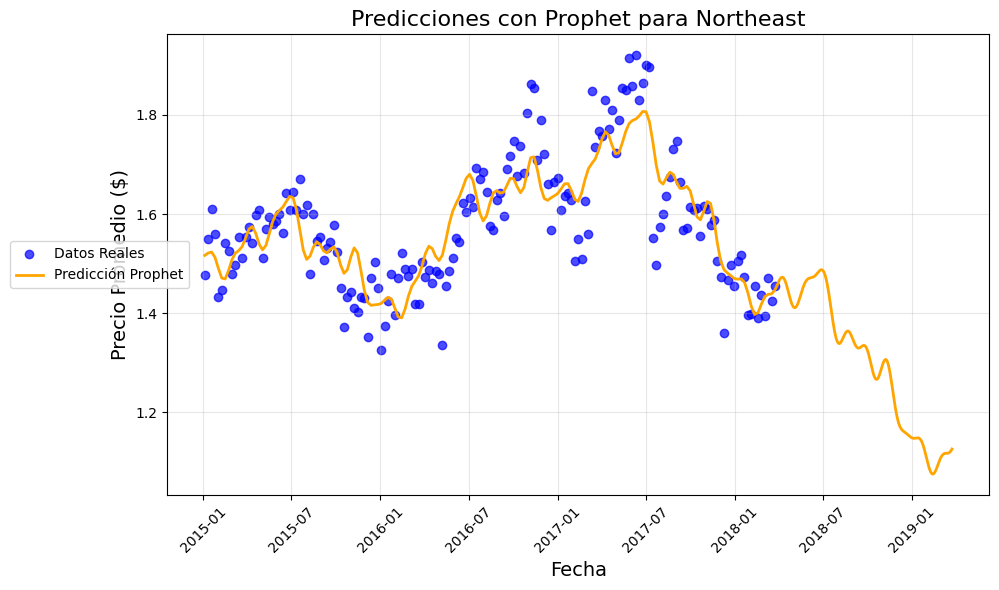

21:19:41 - cmdstanpy - INFO - Chain [1] start processing
21:19:41 - cmdstanpy - INFO - Chain [1] done processing


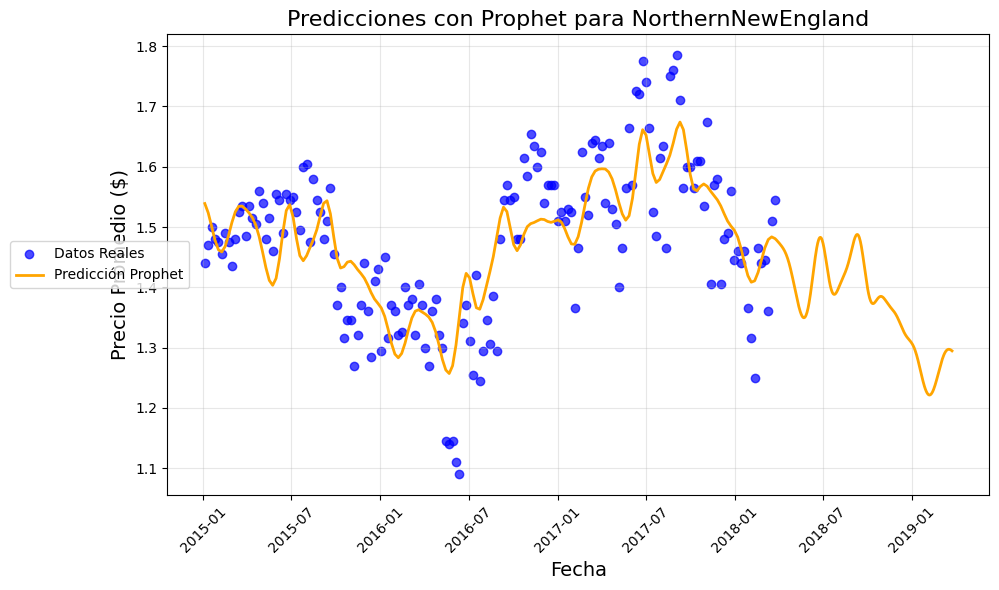

21:19:42 - cmdstanpy - INFO - Chain [1] start processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing


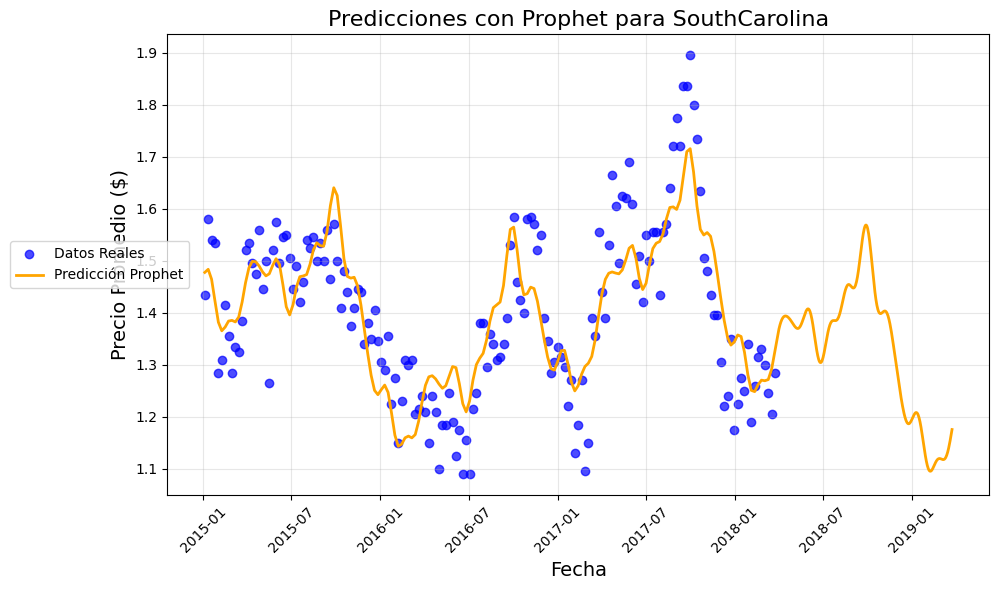

21:19:42 - cmdstanpy - INFO - Chain [1] start processing
21:19:42 - cmdstanpy - INFO - Chain [1] done processing


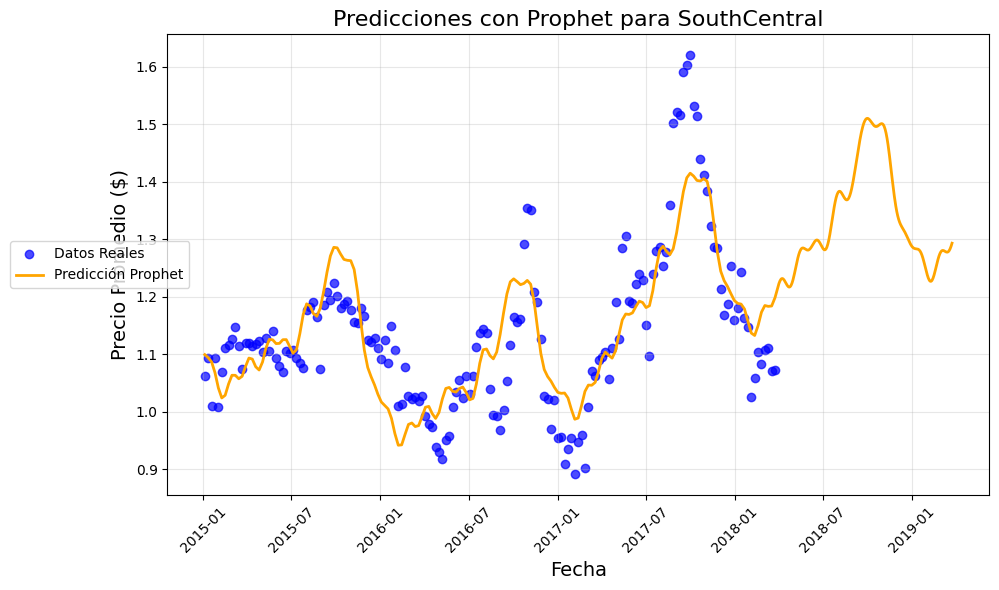

21:19:43 - cmdstanpy - INFO - Chain [1] start processing
21:19:43 - cmdstanpy - INFO - Chain [1] done processing


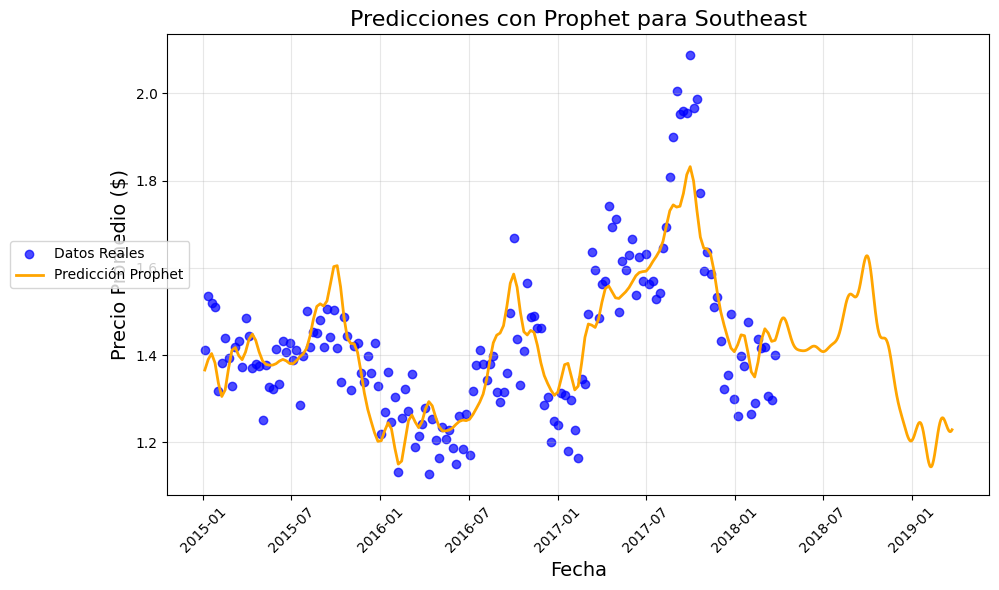

21:19:44 - cmdstanpy - INFO - Chain [1] start processing
21:19:44 - cmdstanpy - INFO - Chain [1] done processing


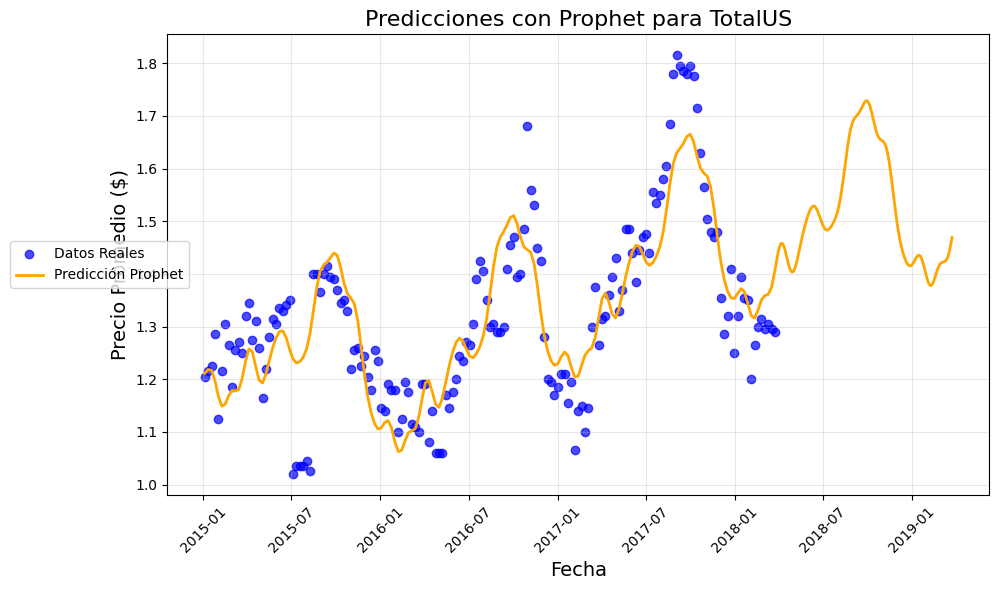

21:19:45 - cmdstanpy - INFO - Chain [1] start processing
21:19:45 - cmdstanpy - INFO - Chain [1] done processing


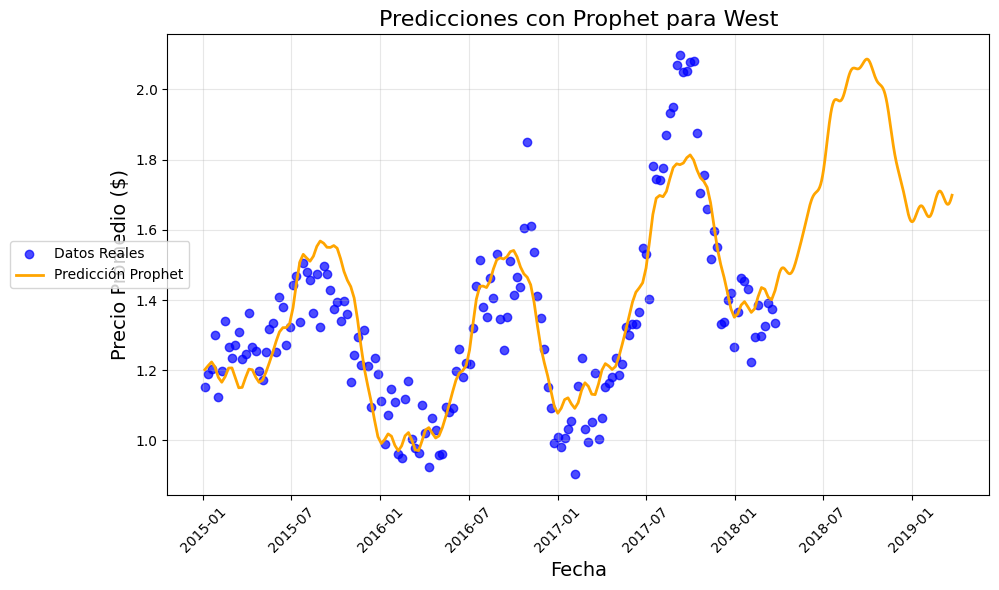

21:19:45 - cmdstanpy - INFO - Chain [1] start processing
21:19:45 - cmdstanpy - INFO - Chain [1] done processing


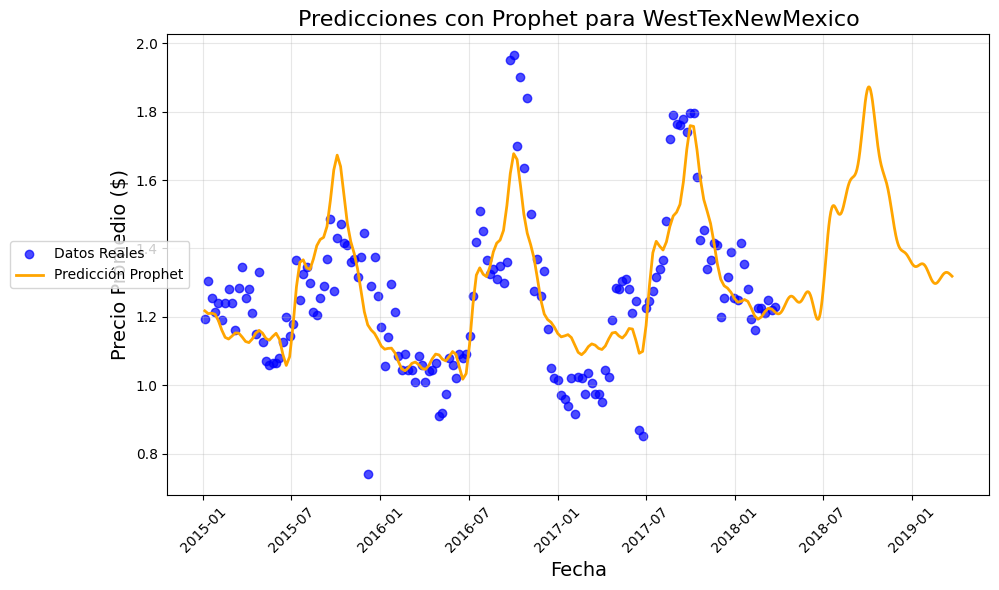

In [27]:
from prophet import Prophet

# Iterar por cada región
for broad_region in broad_regions:
    # Filtrar datos de la región
    region_data = grouped_data[grouped_data['broad_region'] == broad_region].copy()

    # Preparar datos para Prophet
    prophet_data = region_data[['Date', 'AveragePrice']].rename(columns={'Date': 'ds', 'AveragePrice': 'y'})

    # Crear y entrenar el modelo
    model = Prophet()
    model.fit(prophet_data)

    # Generar predicciones futuras
    future = model.make_future_dataframe(periods=365)  
    forecast = model.predict(future)

    # Crear gráficos
    plt.figure(figsize=(10, 6))

    # Gráfico de los datos reales
    plt.scatter(region_data['Date'], region_data['AveragePrice'], alpha=0.7, label='Datos Reales', color='blue')

    # Agregar las predicciones de Prophet
    plt.plot(forecast['ds'], forecast['yhat'], label='Predicción Prophet', color='orange', linewidth=2)

    # Configuración del gráfico
    plt.title(f'Predicciones con Prophet para {broad_region}', fontsize=16)
    plt.xlabel('Fecha', fontsize=14)
    plt.ylabel('Precio Promedio ($)', fontsize=14)
    plt.grid(alpha=0.3)
    plt.xticks(rotation=45)
    plt.legend(loc='center left', bbox_to_anchor=(-0.2, 0.5))  # Leyenda a la izquierda
    plt.tight_layout()
    plt.show()

EXPLICACIÓN

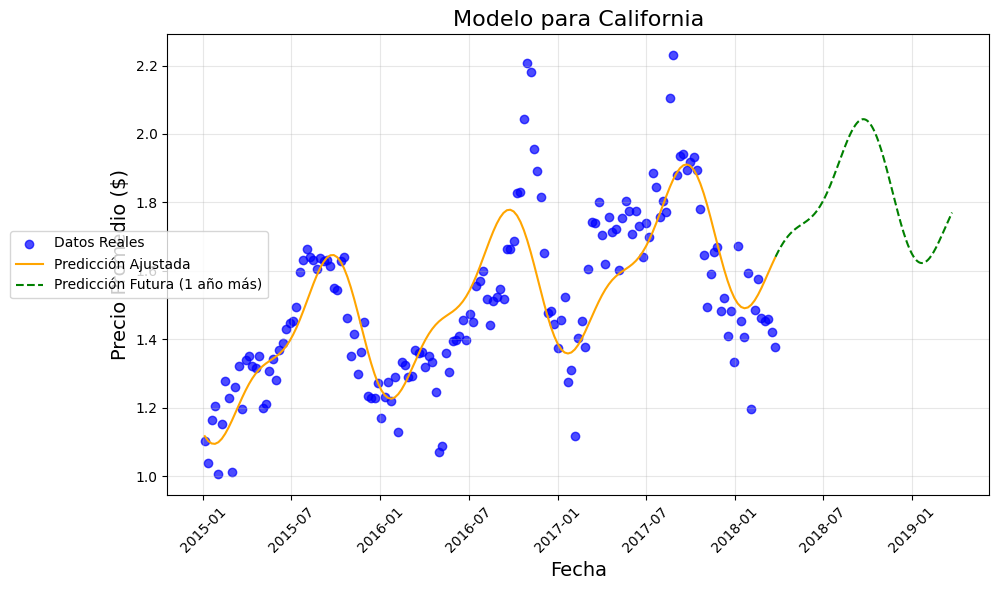

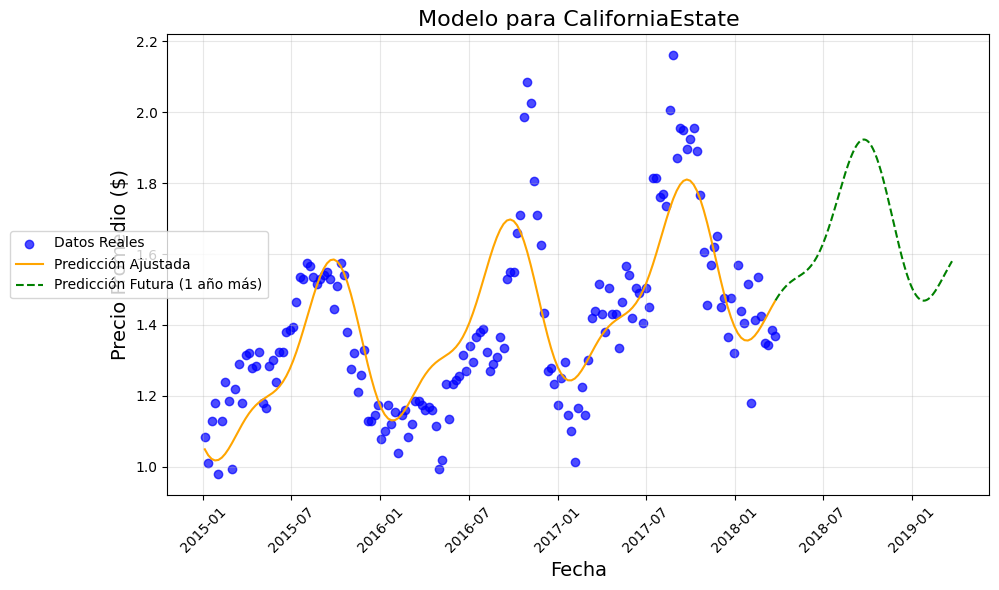

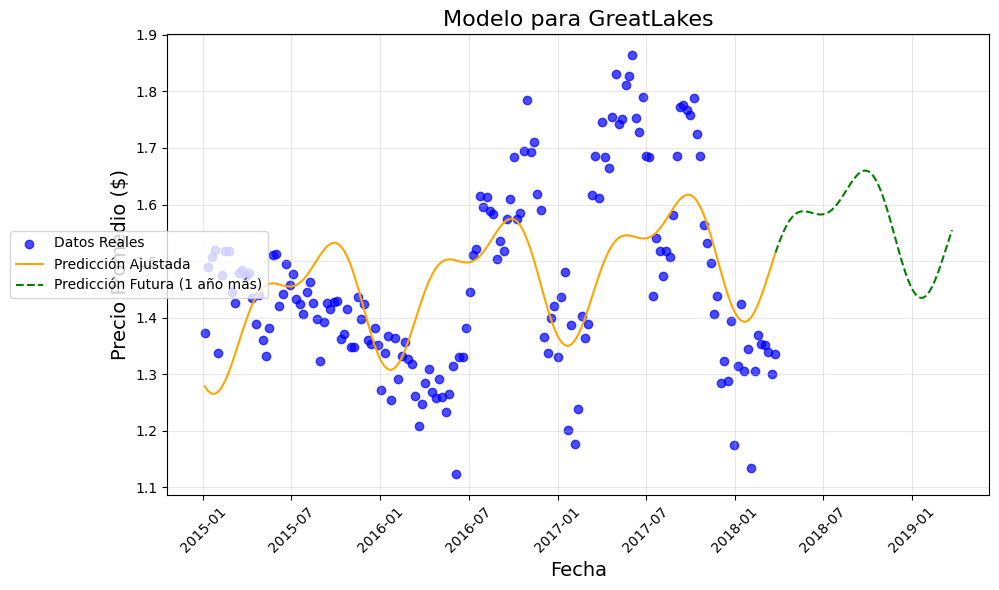

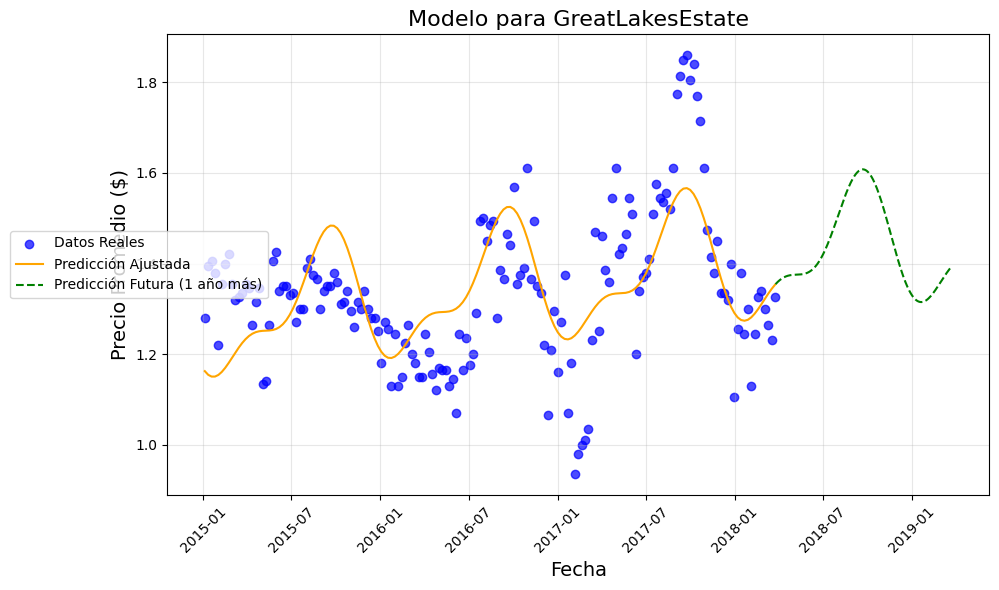

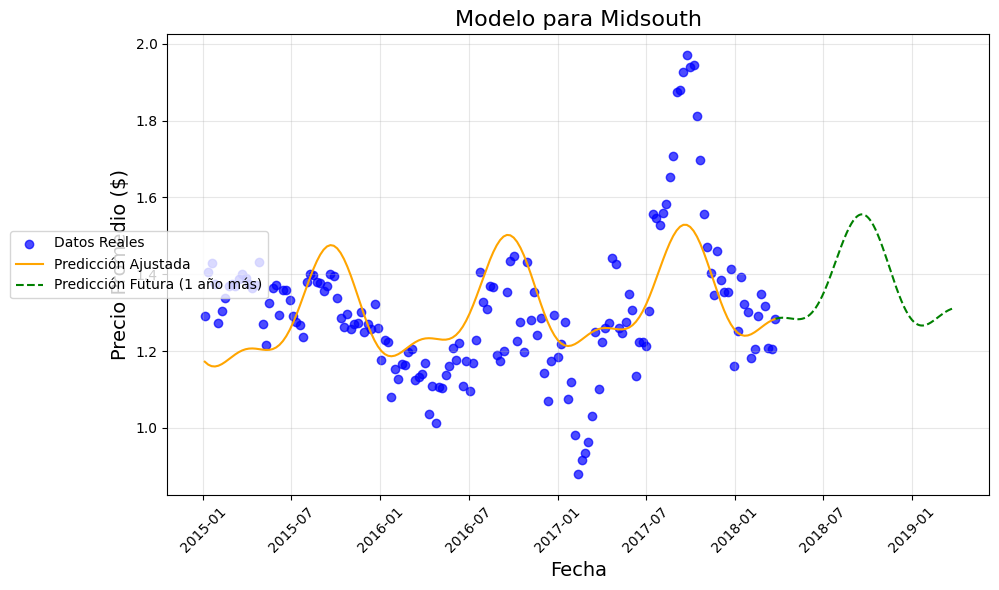

...

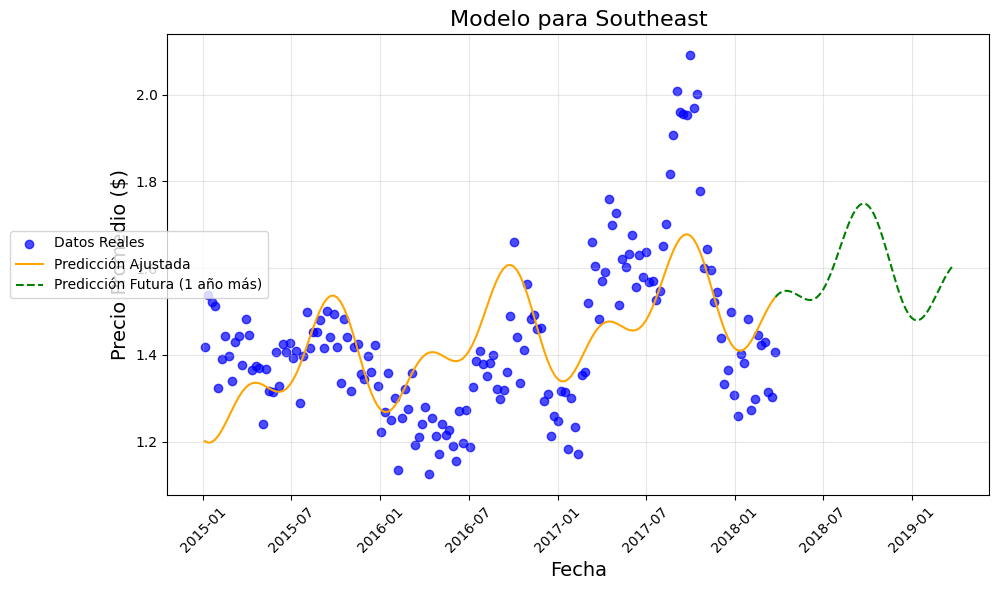

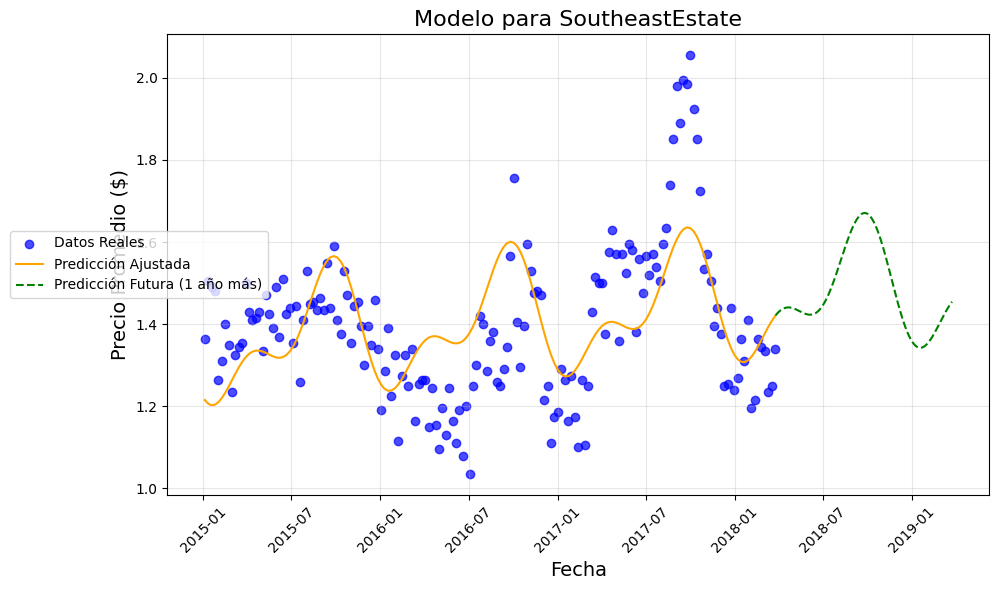

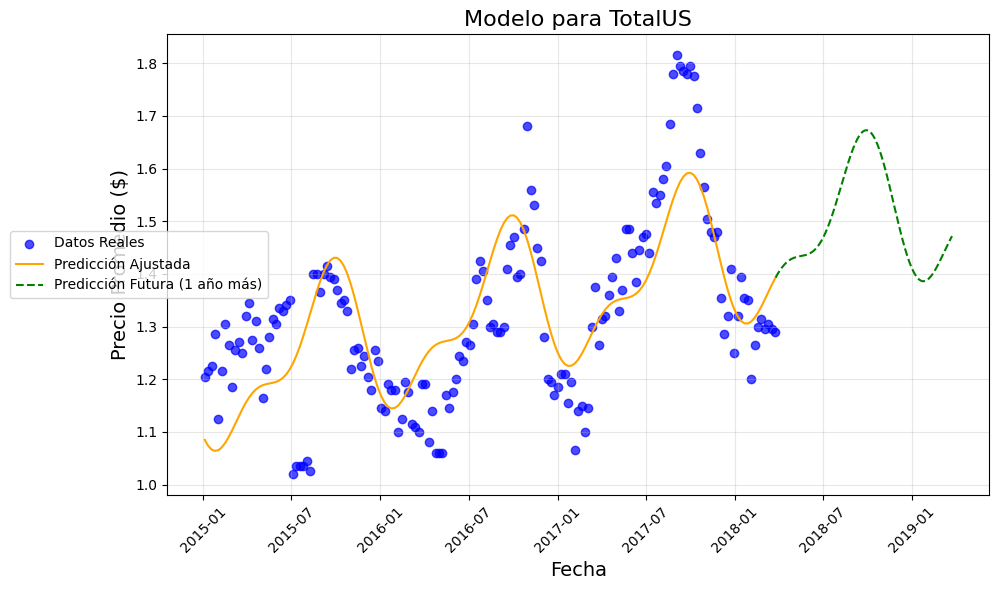

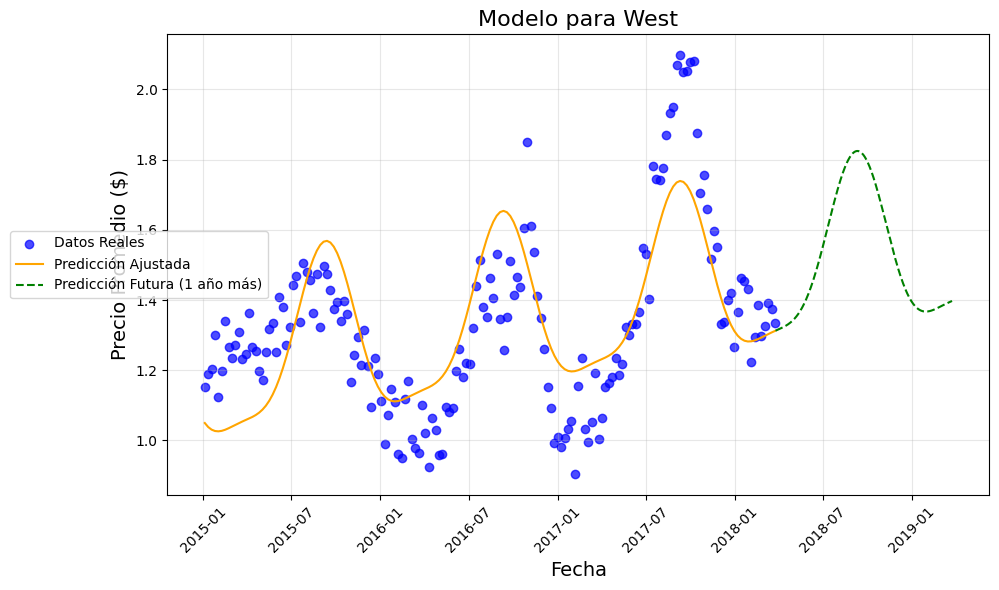

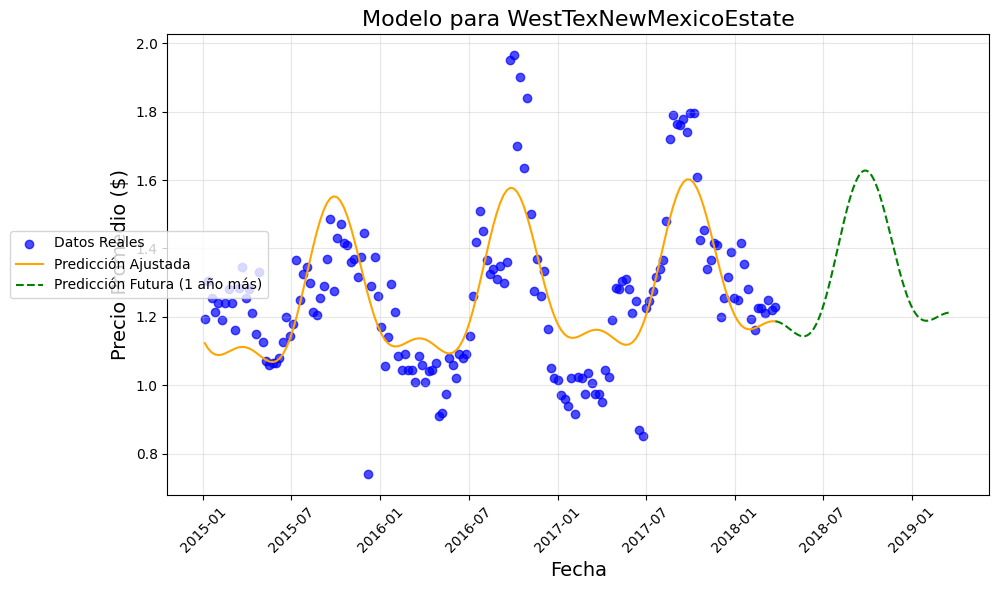

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Modelo completo: tendencia lineal + estacionalidad de Fourier
def model(t, params):
    a, b, a1, b1, a2, b2 = params
    P = 365  # Periodo anual
    trend = a * t + b
    seasonal = (a1 * np.sin(2 * np.pi * t / P) + b1 * np.cos(2 * np.pi * t / P) +
                a2 * np.sin(4 * np.pi * t / P) + b2 * np.cos(4 * np.pi * t / P))
    return trend + seasonal

# Gradiente y Hessiana del error cuadrático
def gradient_hessian(X, y, params):
    a, b, a1, b1, a2, b2 = params
    P = 365
    t = X
    residuals = y - model(t, params)
    
    # Gradiente
    grad = np.zeros(6)
    grad[0] = -2 * np.sum(residuals * t)  # Derivada respecto a a
    grad[1] = -2 * np.sum(residuals)  # Derivada respecto a b
    grad[2] = -2 * np.sum(residuals * np.sin(2 * np.pi * t / P))  # a1
    grad[3] = -2 * np.sum(residuals * np.cos(2 * np.pi * t / P))  # b1
    grad[4] = -2 * np.sum(residuals * np.sin(4 * np.pi * t / P))  # a2
    grad[5] = -2 * np.sum(residuals * np.cos(4 * np.pi * t / P))  # b2
    
    # Hessiana aproximada (diagonal dominante)
    hess = np.zeros((6, 6))
    hess[0, 0] = 2 * np.sum(t ** 2)
    hess[1, 1] = 2 * len(t)
    hess[2, 2] = 2 * np.sum(np.sin(2 * np.pi * t / P) ** 2)
    hess[3, 3] = 2 * np.sum(np.cos(2 * np.pi * t / P) ** 2)
    hess[4, 4] = 2 * np.sum(np.sin(4 * np.pi * t / P) ** 2)
    hess[5, 5] = 2 * np.sum(np.cos(4 * np.pi * t / P) ** 2)
    
    return grad, hess

# Método de Newton-Raphson
def newton_raphson(X, y, params_init, tol=1e-6, max_iter=100):
    params = params_init
    for _ in range(max_iter):
        grad, hess = gradient_hessian(X, y, params)
        delta = np.linalg.solve(hess, -grad)  # Resolver Hessiana * delta = -gradiente
        params += delta
        if np.linalg.norm(delta) < tol:
            break
    return params

# Código principal
for broad_region in broad_regions:
    # Filtrar datos de la región
    region_data = grouped_data[grouped_data['broad_region'] == broad_region].copy()
    region_data['Time'] = (region_data['Date'] - region_data['Date'].min()).dt.days
    X = region_data['Time'].values
    y = region_data['AveragePrice'].values

    # Inicialización de parámetros para Newton-Raphson
    params_init = np.zeros(6)  # a, b, a1, b1, a2, b2
    opt_params = newton_raphson(X, y, params_init)
    a, b, a1, b1, a2, b2 = opt_params

    # Modelo ajustado
    trend_fitted = a * X + b
    seasonal_fitted = model(X, opt_params) - trend_fitted
    fitted = trend_fitted + seasonal_fitted

    # Predicciones futuras
    future_time = np.arange(X.max() + 1, X.max() + 366)
    future_trend = a * future_time + b
    future_seasonal = model(future_time, opt_params) - future_trend
    future_predicted = future_trend + future_seasonal
    future_dates = [region_data['Date'].min() + pd.Timedelta(days=int(t)) for t in future_time]

    # Gráfico
    plt.figure(figsize=(10, 6))
    plt.scatter(region_data['Date'], y, alpha=0.7, label='Datos Reales', color='blue')
    plt.plot(region_data['Date'], fitted, label='Predicción Ajustada', color='orange')
    plt.plot(future_dates, future_predicted, label='Predicción Futura (1 año más)', linestyle='--', color='green')

    plt.title(f'Modelo para {broad_region}', fontsize=16)
    plt.xlabel('Fecha', fontsize=14)
    plt.ylabel('Precio Promedio ($)', fontsize=14)
    plt.legend(loc='center left', bbox_to_anchor=(-0.2, 0.5))
    plt.grid(alpha=0.3)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
